# DATA ANALYSIS - STARE

## House Keeping

In [1]:
import sys
import os
sys.path.append('/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/')

In [2]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats 
from scipy.stats import shapiro , kstest, mannwhitneyu, ttest_rel
import torch
from torch import nn
from datasets.datasets import MRIDataset, STAREDataset

from helper_func.analyis_helper import clean_df, plot_boxplots, visualize, generate_batch_views, visualize_views

## Load Data

In [4]:
SSA_path_box = "/scratch-second/radjoe_data/2306_result/prep/results_med/BraTS_SSA/MedSAM2/SSA_boxes.csv"
GLI_path_box = "/scratch-second/radjoe_data/2306_result/prep/results_med/BraTS_GLI/MedSAM2/SSA_boxes.csv"

TTA_FT_SSA_path  = "/scratch-second/radjoe_data/2306_result/tta_results/BraTS_SSA/SSA_boxes.csv"
TTA_FT_GLI_path = "/scratch-second/radjoe_data/2306_result/tta_results/BraTS_GLI/SSA_boxes.csv"

TTA_SSA_path = "/scratch-second/radjoe_data/2306_result/temp_store/BraTS-SSA/SSA_boxes.csv"
TTA_GLI_path = "/scratch-second/radjoe_data/2306_result/temp_store/BraTSGLI/SSA_boxes.csv"

In [5]:
SSA_label_boxes = "/scratch-second/radjoe_data/2306_result/prep/results_med/BraTS_SSA/MedSAM2/boxes"
GLI_label_boxes = "/scratch-second/radjoe_data/2306_result/prep/results_med/BraTS_GLI/MedSAM2/boxes"

SSA_TTA_TF_label_boxes = "/scratch-second/radjoe_data/2306_result/tta_results/BraTS_SSA/boxes"
GLI_TTA_TF_label_boxes = "/scratch-second/radjoe_data/2306_result/tta_results/BraTS_GLI/boxes"

SSA_TTA_label_boxes = "/scratch-second/radjoe_data/2306_result/temp_store/BraTS-SSA/MedSAM2"
GLI_TTA_label_boxes = "/scratch-second/radjoe_data/2306_result/temp_store/BraTSGLI/MedSAM2"

In [6]:
SSA_df_box_unclean =  pd.read_csv(SSA_path_box)
GLI_df_box_unclean = pd.read_csv(GLI_path_box)

SSAT_df_box_unclean = pd.read_csv(TTA_SSA_path)
GLIT_df_box_unclean = pd.read_csv(TTA_GLI_path)

SSATF_df_box_unclean = pd.read_csv(TTA_FT_SSA_path)
GLITF_df_box_unclean = pd.read_csv(TTA_FT_GLI_path)

In [7]:
SSA_df_box = clean_df(SSA_df_box_unclean, True, 'brats')
GLI_df_box = clean_df(GLI_df_box_unclean, True, 'brats')

SSAT_df_box = clean_df(SSAT_df_box_unclean, True, 'brats') 
GLIT_df_box = clean_df(GLIT_df_box_unclean, True, 'brats') 

SSATF_df_box = clean_df(SSATF_df_box_unclean, True, 'brats') 
GLITF_df_box = clean_df(GLITF_df_box_unclean, True, 'brats') 

## Setup

In [8]:
SSA_video_path =  "/scratch_net/ken/radjoe/Preprocess_BraTS2023_SSA_Training/images_UNN"  
SSA_label_path = "/scratch_net/ken/radjoe/Preprocess_BraTS2023_SSA_Training/labels_UNN"

In [9]:
GLI_video_path =  '/scratch_net/ken/radjoe/BraTS/Validation/images_UNN'  
GLI_label_path = '/scratch_net/ken/radjoe/BraTS/Validation/labels_UNN'

In [10]:
SSA_FT_rows = SSA_df_box['name'].sample(n=10, random_state=42).to_list()
GLI_FT_rows = GLI_df_box['name'].sample(n=10, random_state=42).to_list()

SSA_FT_dataset = MRIDataset(SSA_video_path, SSA_label_path, SSA_FT_rows)
GLI_FT_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_FT_rows)

['BraTS-SSA-00092-000-stk.npy', 'BraTS-SSA-00120-000-stk.npy', 'BraTS-SSA-00037-000-stk.npy', 'BraTS-SSA-00041-000-stk.nii.gz', 'BraTS-SSA-00122-000-stk.npy', 'BraTS-SSA-00028-000-stk.npy', 'BraTS-SSA-00011-000-stk.npy', 'BraTS-SSA-00213-000-stk.nii.gz', 'BraTS-SSA-00146-000-stk.npy', 'BraTS-SSA-00015-000-stk.npy', 'BraTS-SSA-00074-000-stk.nii.gz', 'BraTS-SSA-00093-000-stk.npy', 'BraTS-SSA-00115-000-stk.nii.gz', 'BraTS-SSA-00026-000-stk.nii.gz', 'BraTS-SSA-00152-000-stk.npy', 'BraTS-SSA-00144-000-stk.npy', 'BraTS-SSA-00202-000-stk.nii.gz', 'BraTS-SSA-00044-000-stk.npy', 'BraTS-SSA-00056-000-stk.nii.gz', 'BraTS-SSA-00119-000-stk.nii.gz', 'BraTS-SSA-00015-000-stk.nii.gz', 'BraTS-SSA-00044-000-stk.nii.gz', 'BraTS-SSA-00080-000-stk.nii.gz', 'BraTS-SSA-00047-000-stk.npy', 'BraTS-SSA-00078-000-stk.nii.gz', 'BraTS-SSA-00127-000-stk.npy', 'BraTS-SSA-00110-000-stk.nii.gz', 'BraTS-SSA-00150-000-stk.npy', 'BraTS-SSA-00046-000-stk.nii.gz', 'BraTS-SSA-00223-000-stk.nii.gz', 'BraTS-SSA-00049-000-stk

In [11]:
SSA_TTAFT_rows = SSATF_df_box['name'].sample(n=10, random_state=42).to_list()
GLI_TTAFT_rows = GLITF_df_box['name'].sample(n=10, random_state=42).to_list()

SSA_TTAFT_dataset = MRIDataset(SSA_video_path, SSA_label_path, SSA_TTAFT_rows)
GLI_TTAFT_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_TTAFT_rows)

['BraTS-SSA-00092-000-stk.npy', 'BraTS-SSA-00120-000-stk.npy', 'BraTS-SSA-00037-000-stk.npy', 'BraTS-SSA-00041-000-stk.nii.gz', 'BraTS-SSA-00122-000-stk.npy', 'BraTS-SSA-00028-000-stk.npy', 'BraTS-SSA-00011-000-stk.npy', 'BraTS-SSA-00213-000-stk.nii.gz', 'BraTS-SSA-00146-000-stk.npy', 'BraTS-SSA-00015-000-stk.npy', 'BraTS-SSA-00074-000-stk.nii.gz', 'BraTS-SSA-00093-000-stk.npy', 'BraTS-SSA-00115-000-stk.nii.gz', 'BraTS-SSA-00026-000-stk.nii.gz', 'BraTS-SSA-00152-000-stk.npy', 'BraTS-SSA-00144-000-stk.npy', 'BraTS-SSA-00202-000-stk.nii.gz', 'BraTS-SSA-00044-000-stk.npy', 'BraTS-SSA-00056-000-stk.nii.gz', 'BraTS-SSA-00119-000-stk.nii.gz', 'BraTS-SSA-00015-000-stk.nii.gz', 'BraTS-SSA-00044-000-stk.nii.gz', 'BraTS-SSA-00080-000-stk.nii.gz', 'BraTS-SSA-00047-000-stk.npy', 'BraTS-SSA-00078-000-stk.nii.gz', 'BraTS-SSA-00127-000-stk.npy', 'BraTS-SSA-00110-000-stk.nii.gz', 'BraTS-SSA-00150-000-stk.npy', 'BraTS-SSA-00046-000-stk.nii.gz', 'BraTS-SSA-00223-000-stk.nii.gz', 'BraTS-SSA-00049-000-stk

In [12]:
SSA_TTA_rows = SSAT_df_box['name'].sample(n=10, random_state=42).to_list()
GLI_TTA_rows = GLIT_df_box['name'].sample(n=10, random_state=42).to_list()

SSA_TTA_dataset = MRIDataset(SSA_video_path, SSA_label_path, SSA_TTAFT_rows)
GLI_TTA_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_TTAFT_rows)

['BraTS-SSA-00092-000-stk.npy', 'BraTS-SSA-00120-000-stk.npy', 'BraTS-SSA-00037-000-stk.npy', 'BraTS-SSA-00041-000-stk.nii.gz', 'BraTS-SSA-00122-000-stk.npy', 'BraTS-SSA-00028-000-stk.npy', 'BraTS-SSA-00011-000-stk.npy', 'BraTS-SSA-00213-000-stk.nii.gz', 'BraTS-SSA-00146-000-stk.npy', 'BraTS-SSA-00015-000-stk.npy', 'BraTS-SSA-00074-000-stk.nii.gz', 'BraTS-SSA-00093-000-stk.npy', 'BraTS-SSA-00115-000-stk.nii.gz', 'BraTS-SSA-00026-000-stk.nii.gz', 'BraTS-SSA-00152-000-stk.npy', 'BraTS-SSA-00144-000-stk.npy', 'BraTS-SSA-00202-000-stk.nii.gz', 'BraTS-SSA-00044-000-stk.npy', 'BraTS-SSA-00056-000-stk.nii.gz', 'BraTS-SSA-00119-000-stk.nii.gz', 'BraTS-SSA-00015-000-stk.nii.gz', 'BraTS-SSA-00044-000-stk.nii.gz', 'BraTS-SSA-00080-000-stk.nii.gz', 'BraTS-SSA-00047-000-stk.npy', 'BraTS-SSA-00078-000-stk.nii.gz', 'BraTS-SSA-00127-000-stk.npy', 'BraTS-SSA-00110-000-stk.nii.gz', 'BraTS-SSA-00150-000-stk.npy', 'BraTS-SSA-00046-000-stk.nii.gz', 'BraTS-SSA-00223-000-stk.nii.gz', 'BraTS-SSA-00049-000-stk

In [13]:
# View Transforms for each sample
view_transform = A.Compose([
        # A.RandomGamma(gamma_limit=(90, 110), p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.01, contrast_limit=0.01, p=0.8),
        # A.GaussianBlur(blur_limit=3, p=0.3),
        # A.GaussNoise(var_limit=(10.0, 50.0), p=0.2),
        A.Normalize(mean=[0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225]),
        ToTensorV2()
    ])

## Visualization - Performance of Finetuned MedSAM on BraTS-GLI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


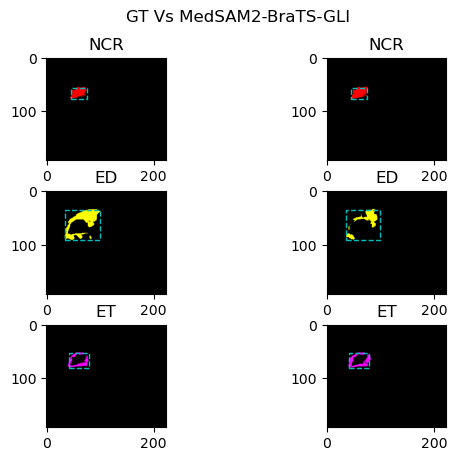

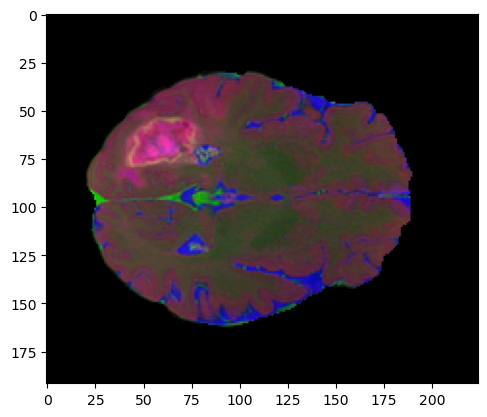

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


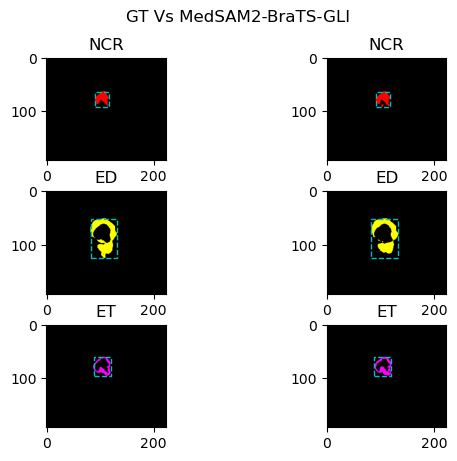

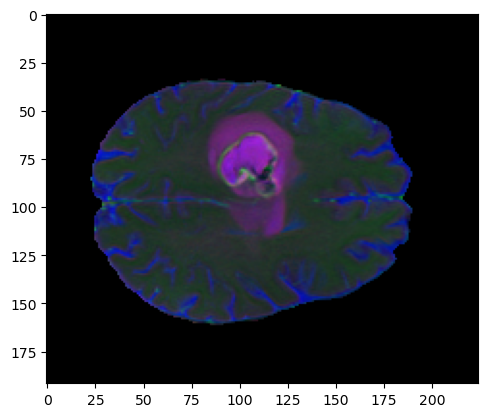

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


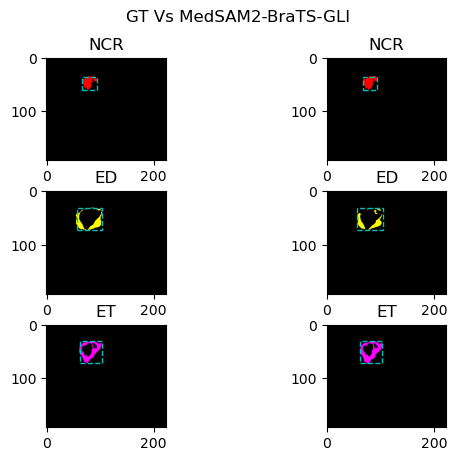

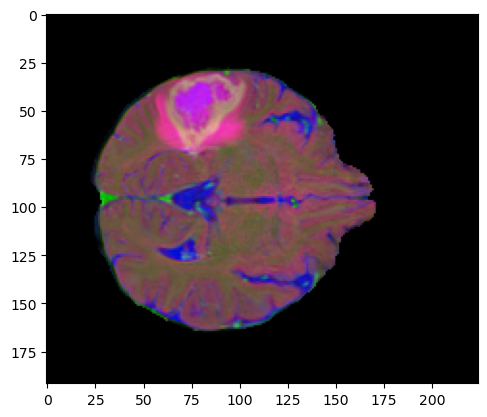

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


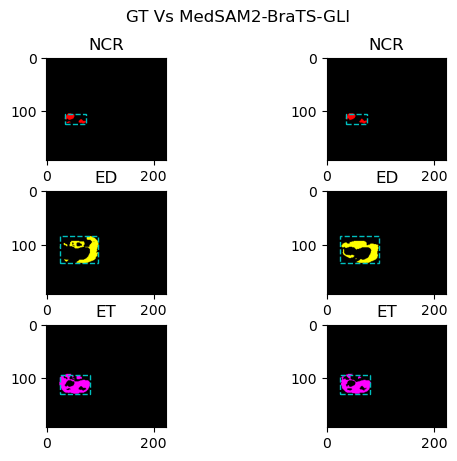

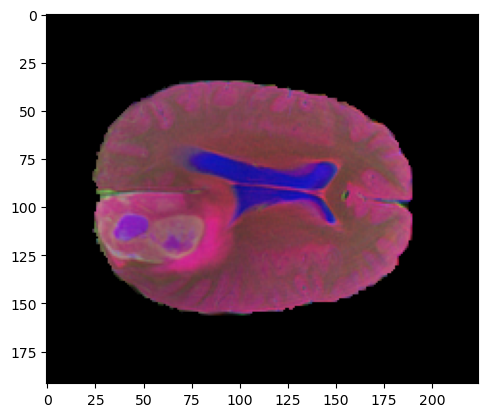

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


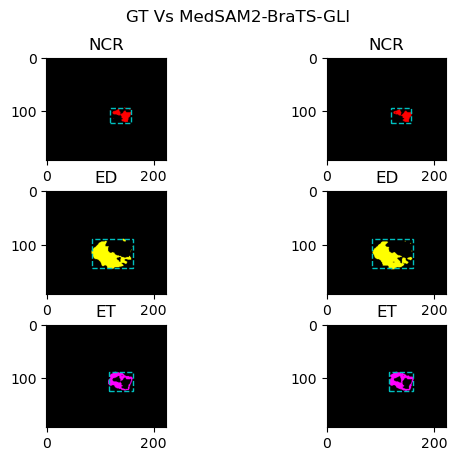

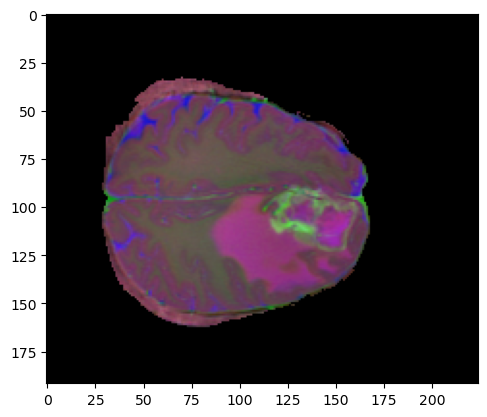

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


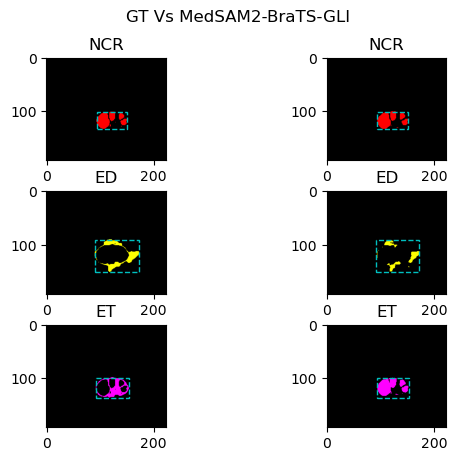

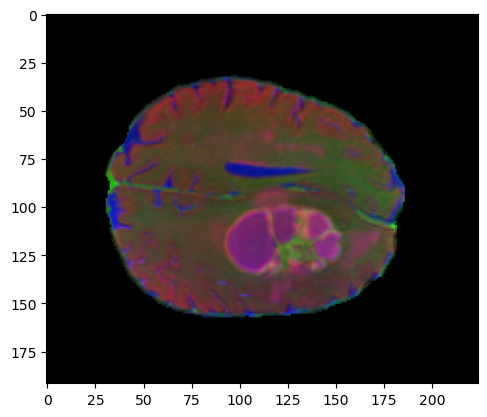

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


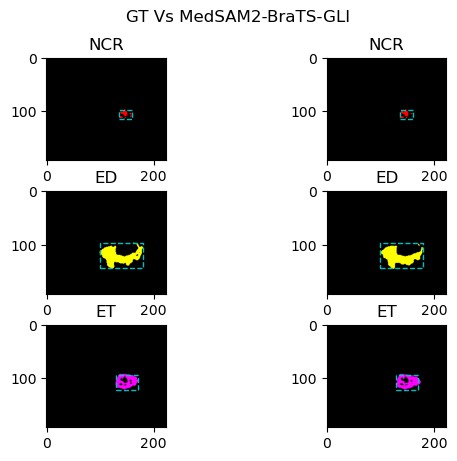

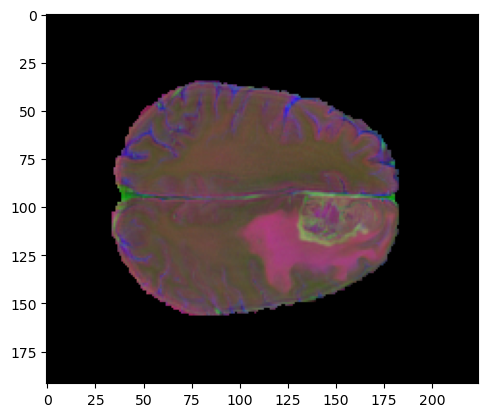

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


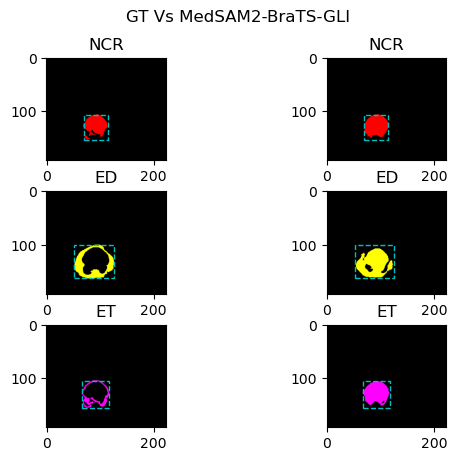

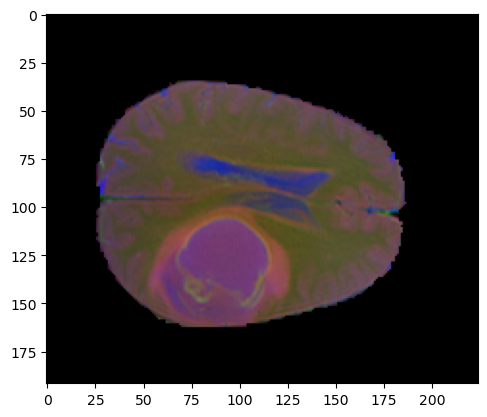

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


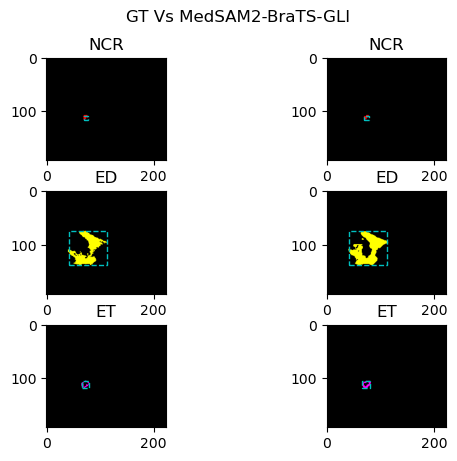

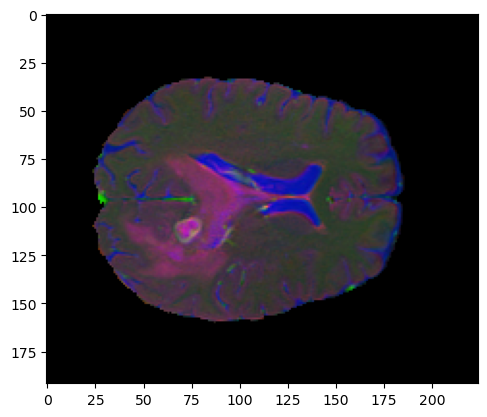

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


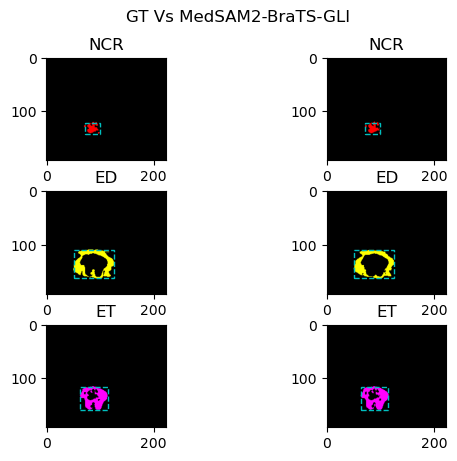

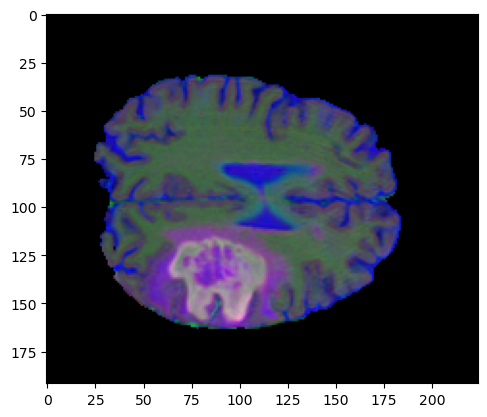

In [14]:
visualize(GLI_FT_dataset, GLI_label_boxes, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path)

## Visualization - Performance of Finetuned MedSAM on BraTS-SSA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


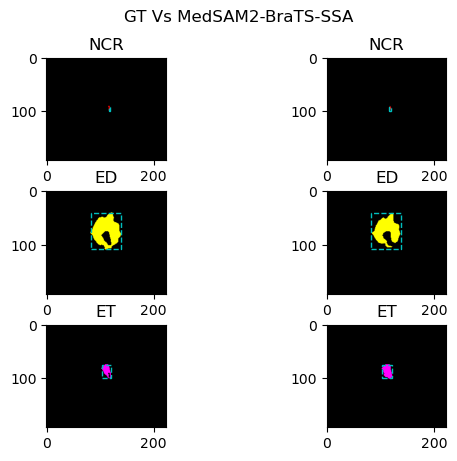

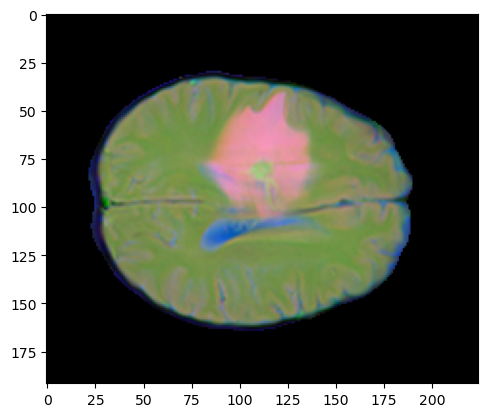

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


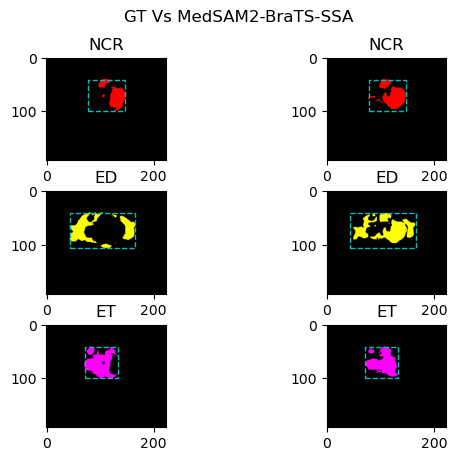

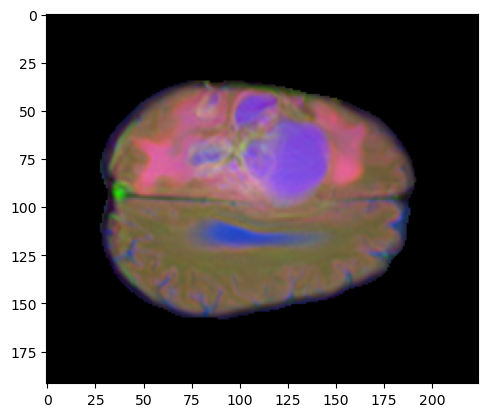

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


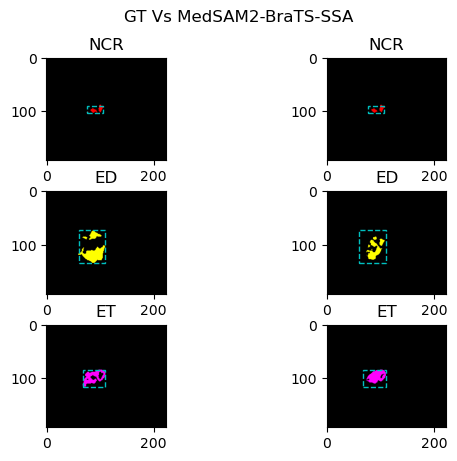

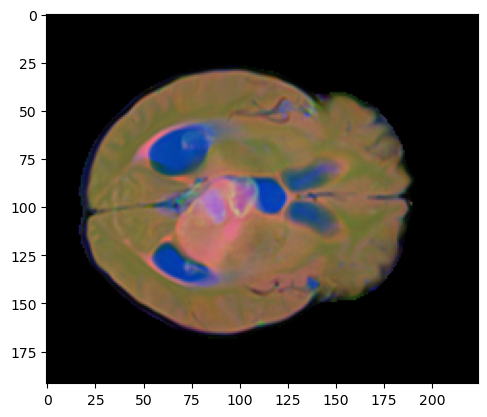

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


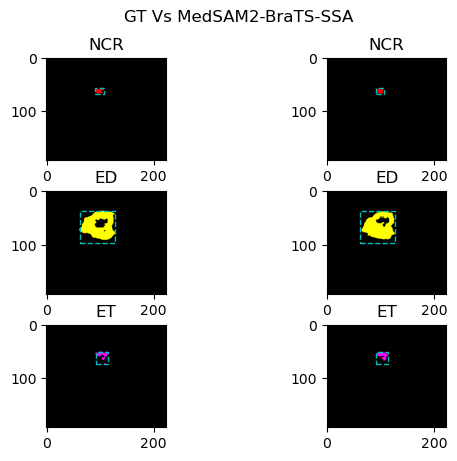

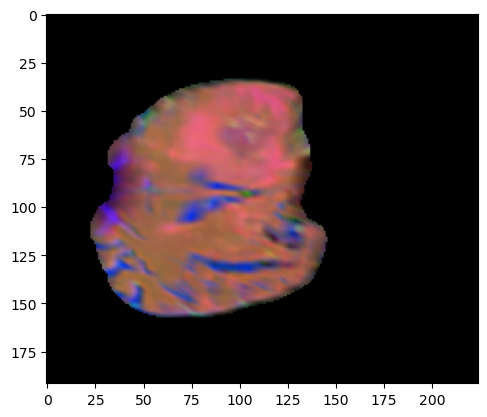

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


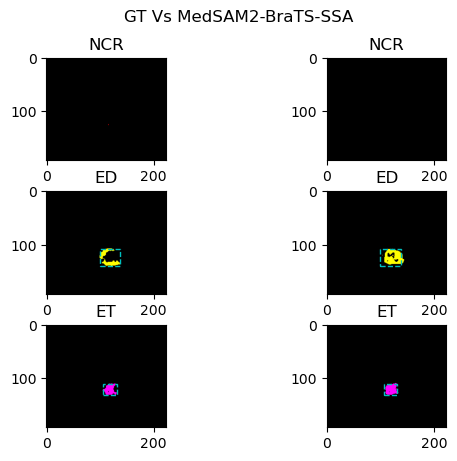

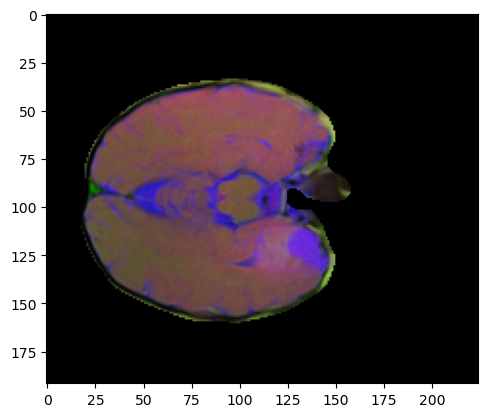

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


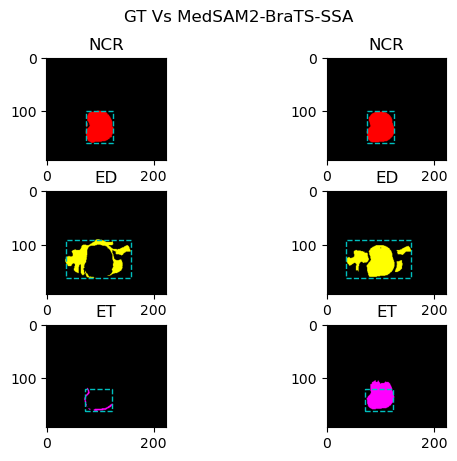

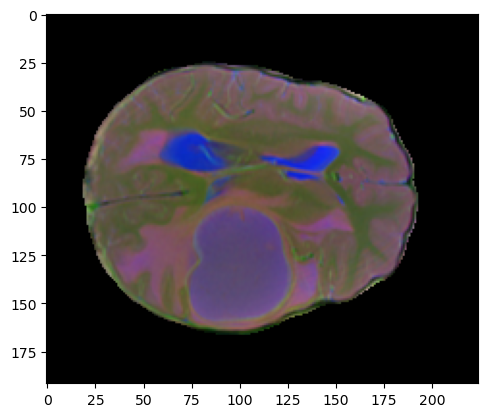

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


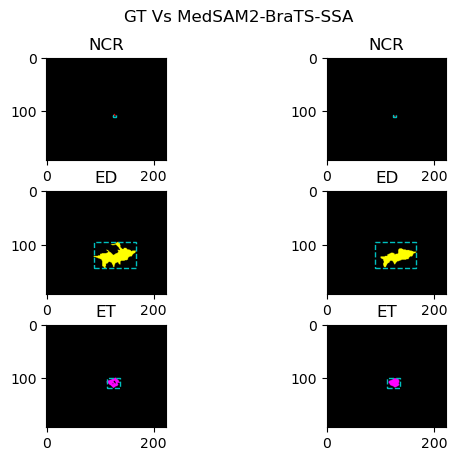

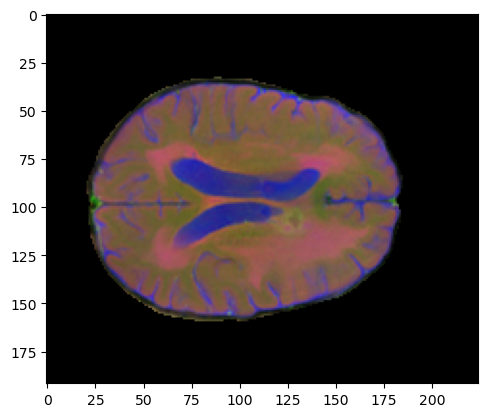

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


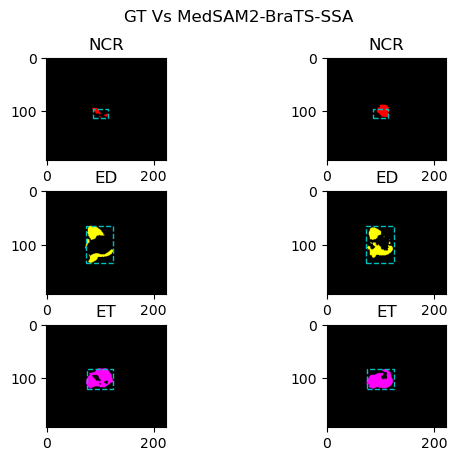

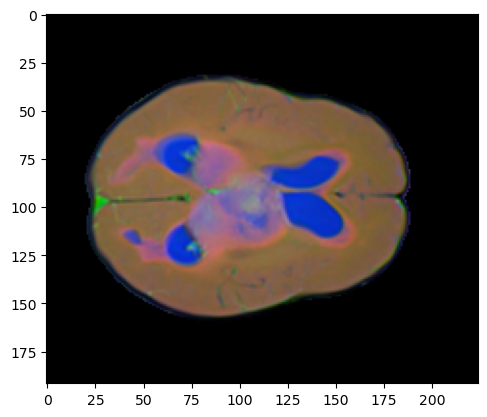

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


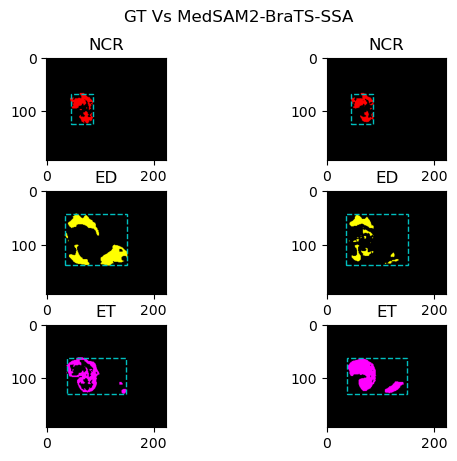

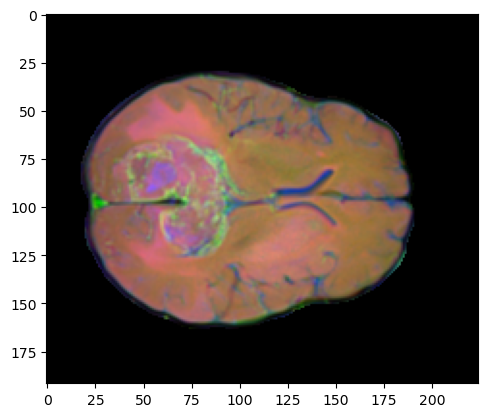

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


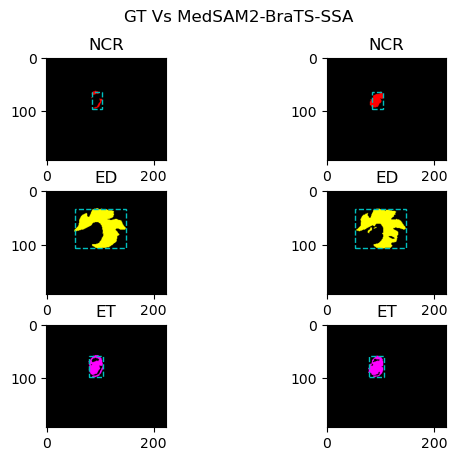

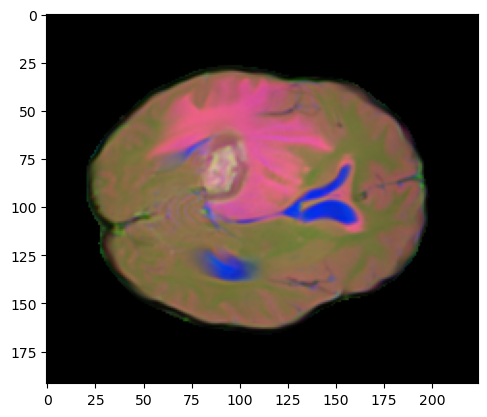

In [15]:
visualize(SSA_FT_dataset, SSA_label_boxes, 'GT Vs MedSAM2-BraTS-SSA', SSA_video_path)

## Visualization - Performance of TTA MedSAM on BraTS-GLI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


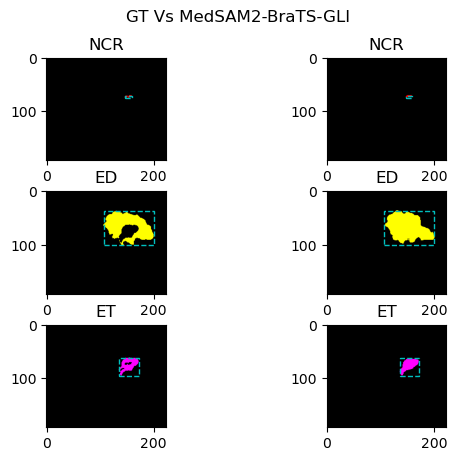

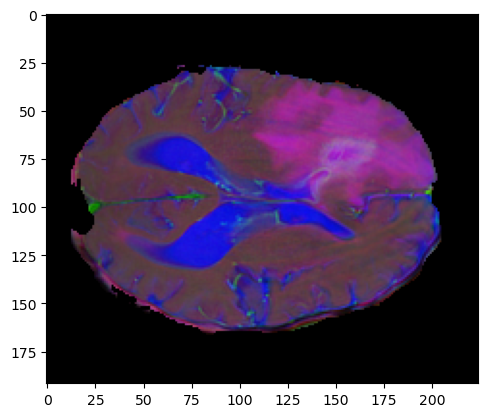

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


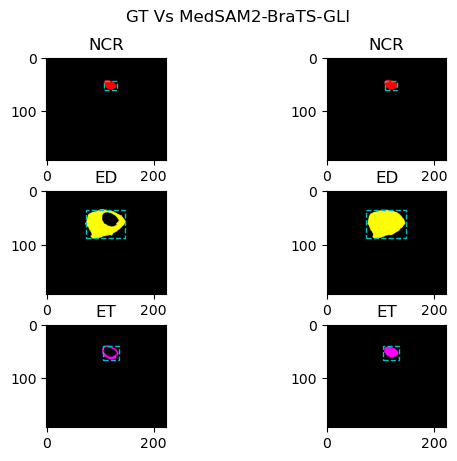

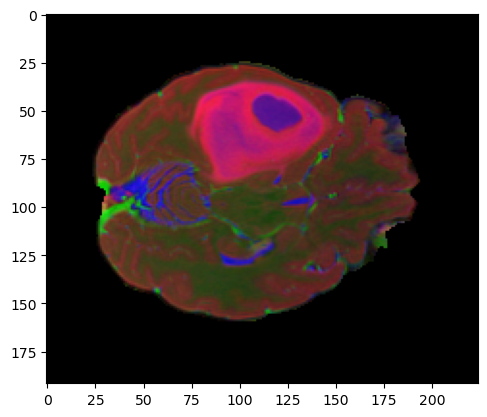

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


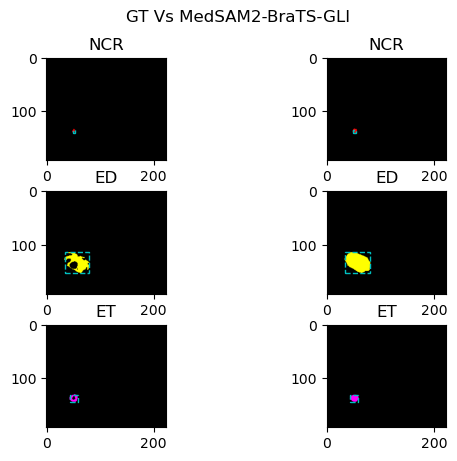

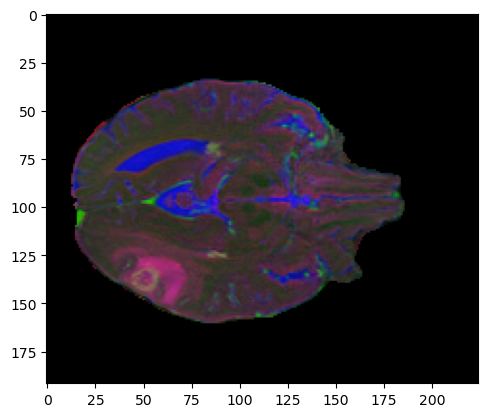

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


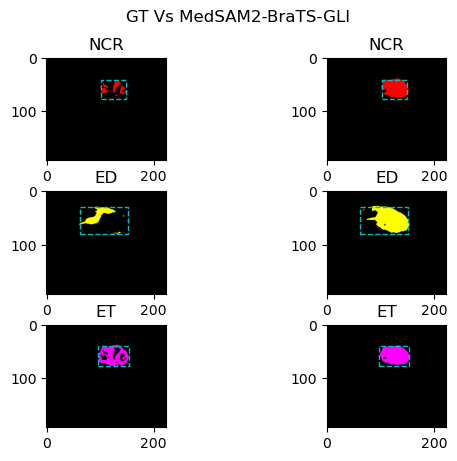

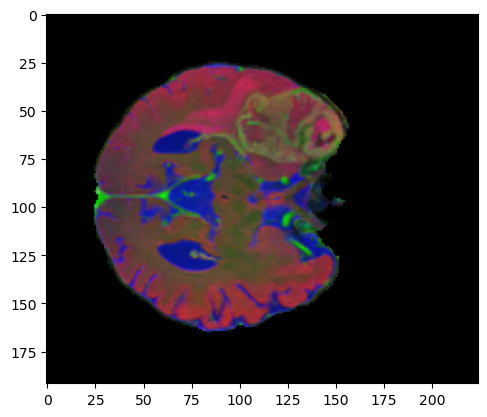

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


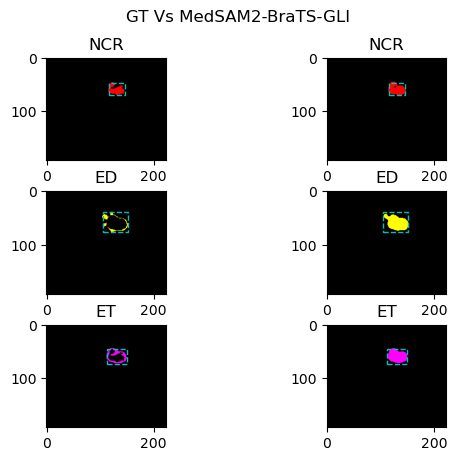

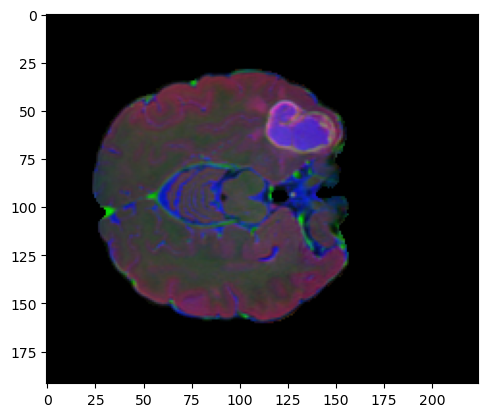

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


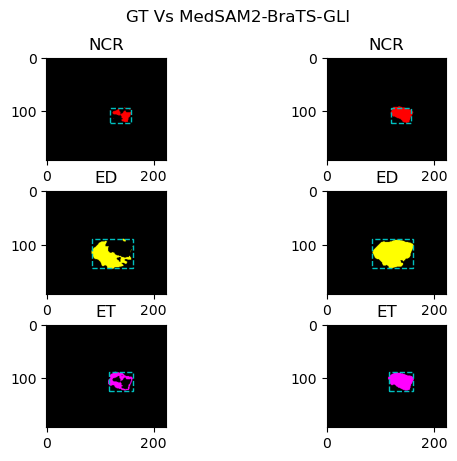

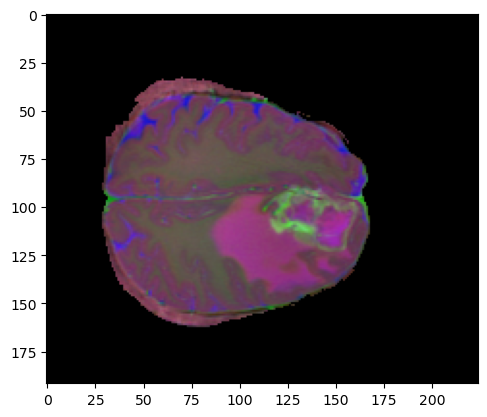

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


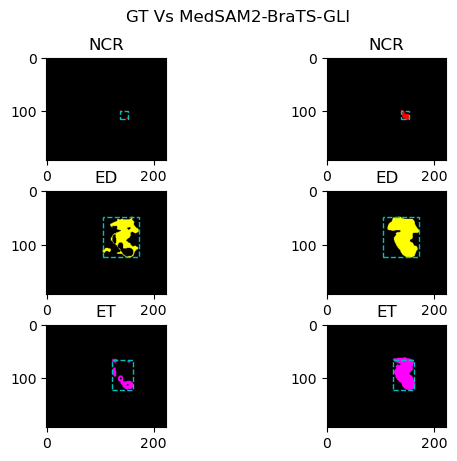

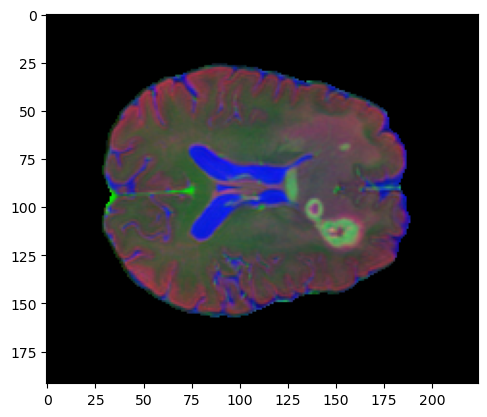

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


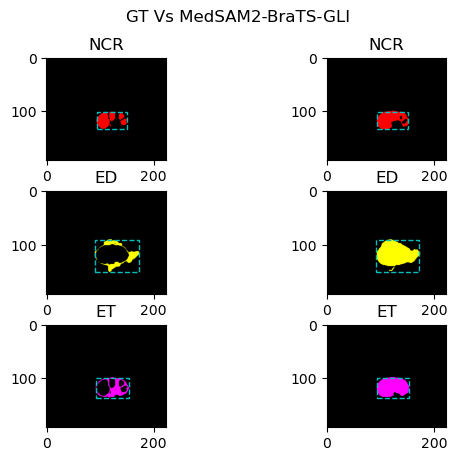

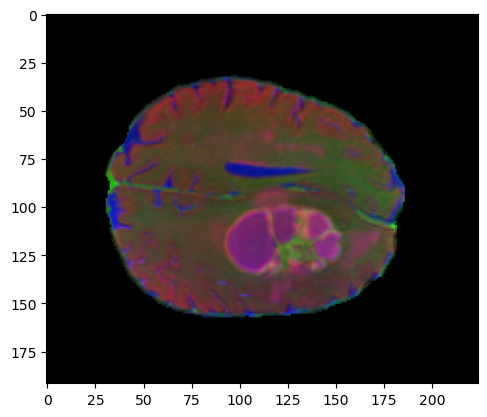

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


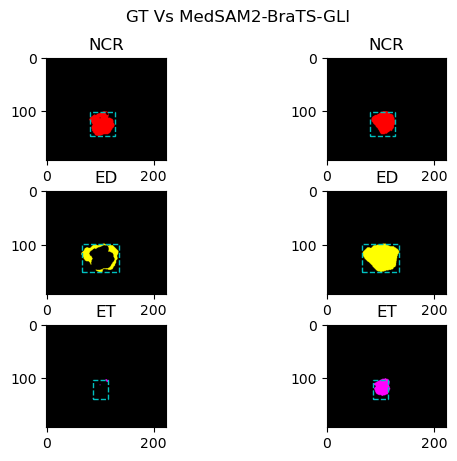

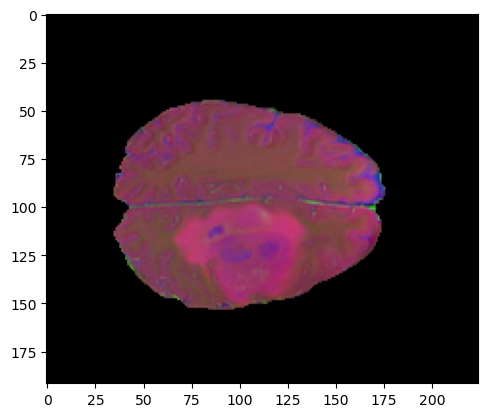

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


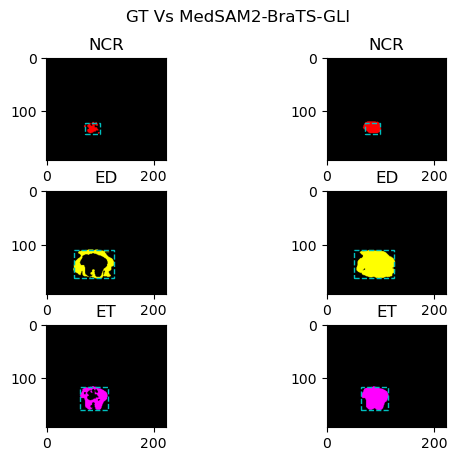

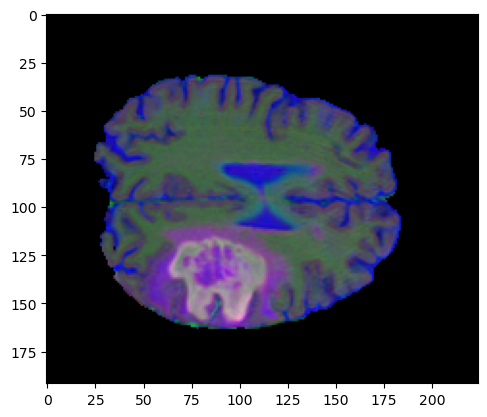

In [16]:
visualize(GLI_TTA_dataset, GLI_TTA_label_boxes, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path)

## Visualization -  Performance of TTA MedSAM on BraTS-SSA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


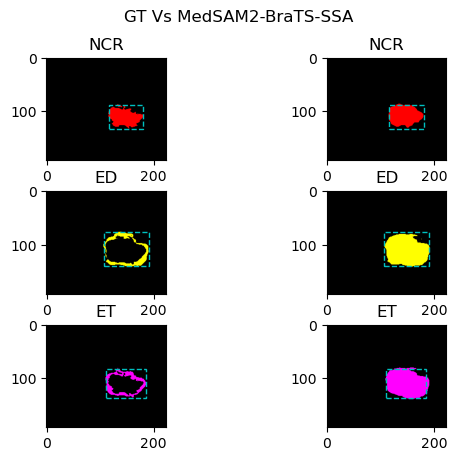

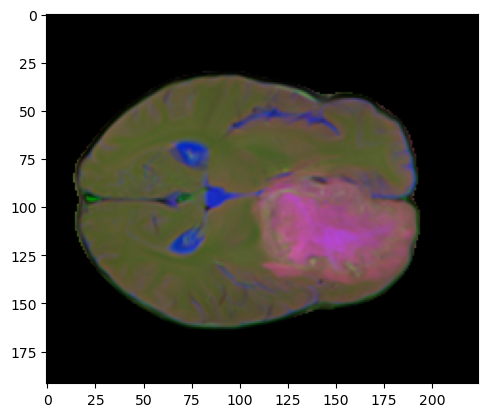

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


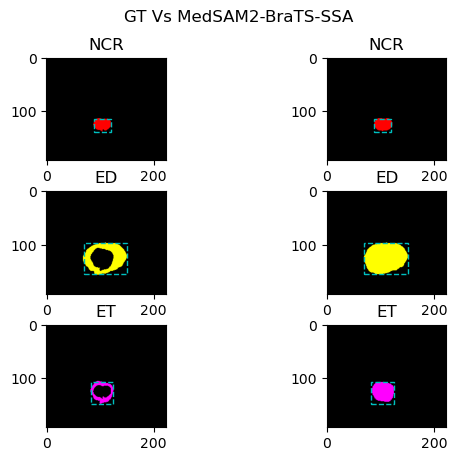

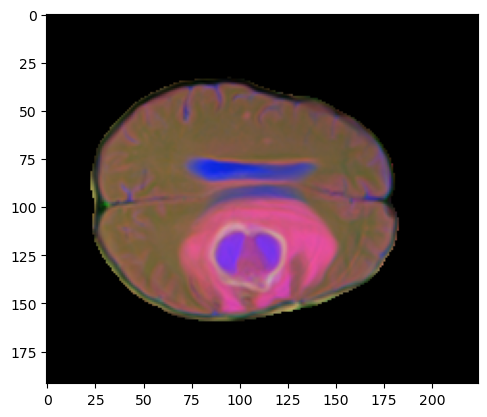

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


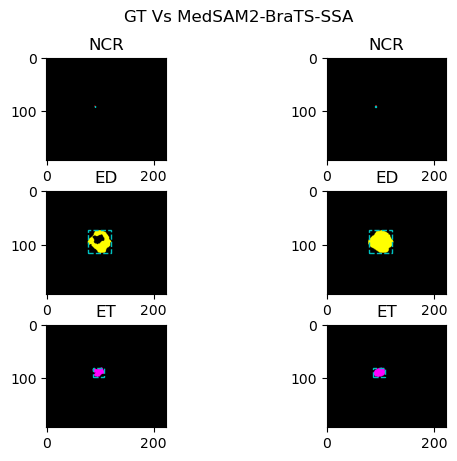

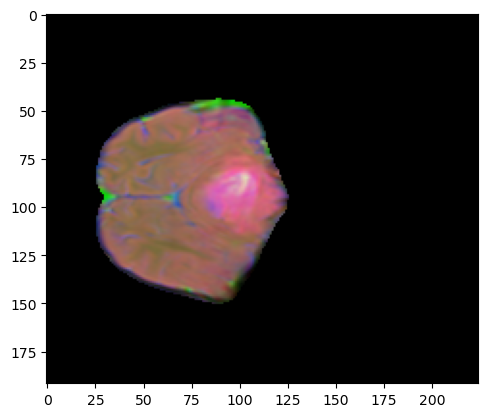

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


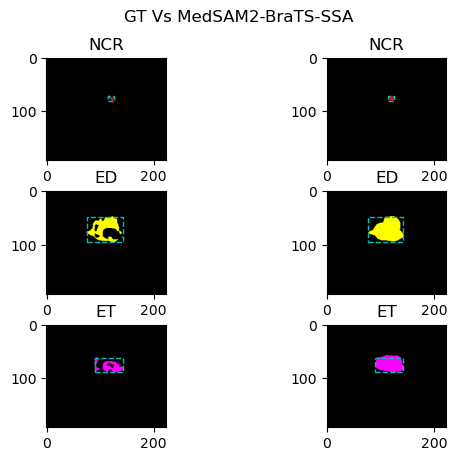

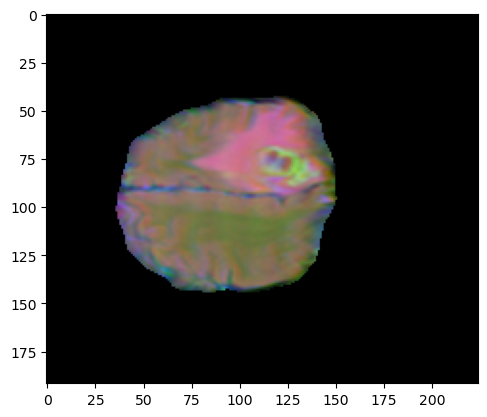

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


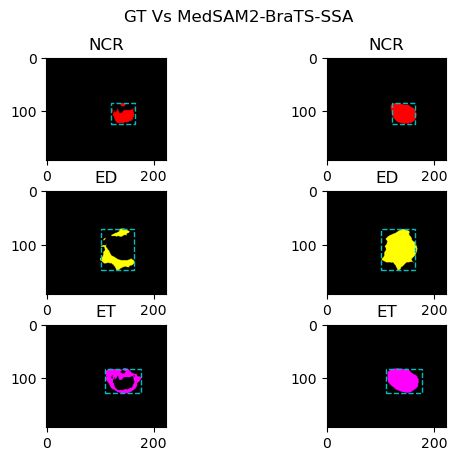

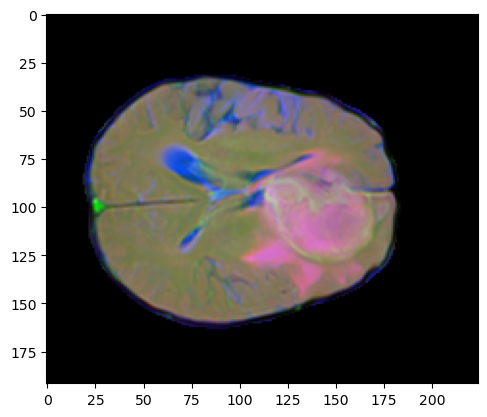

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


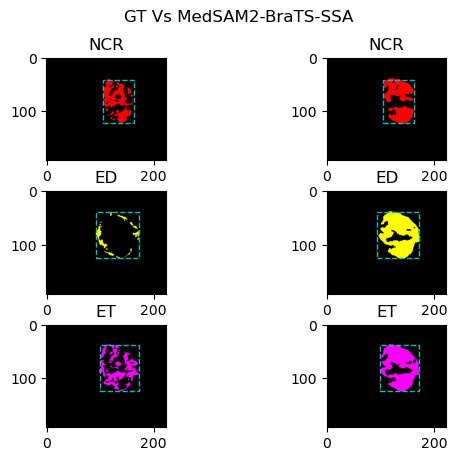

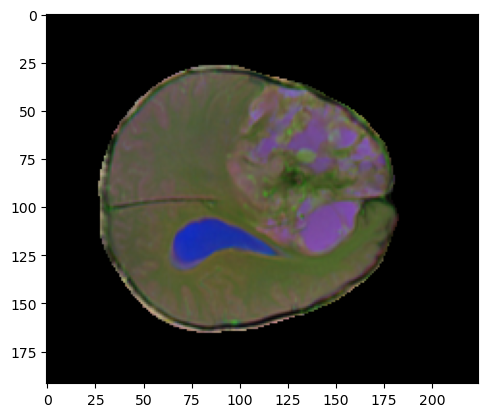

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


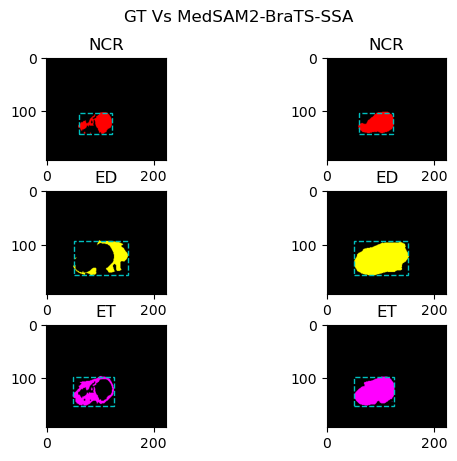

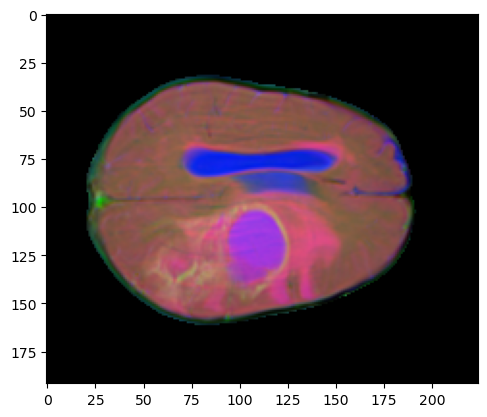

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


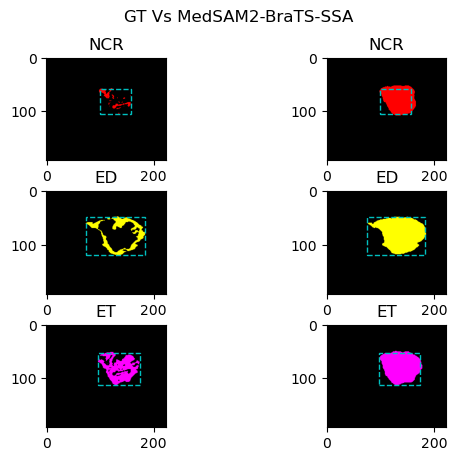

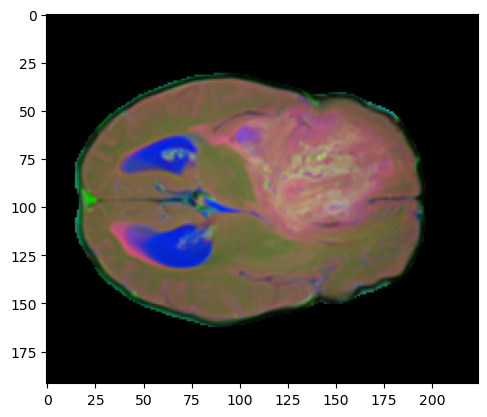

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


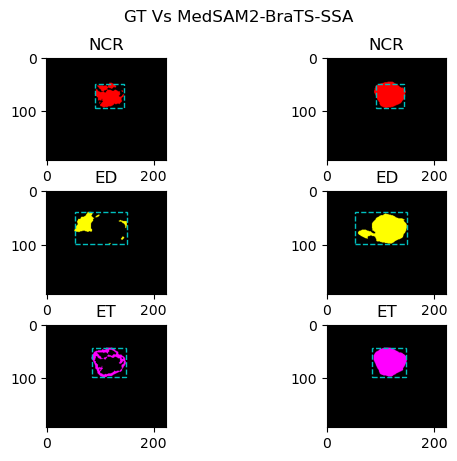

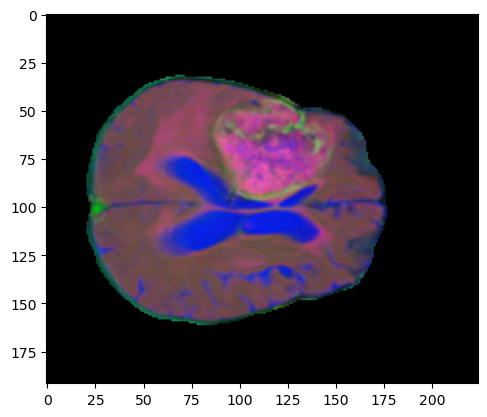

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


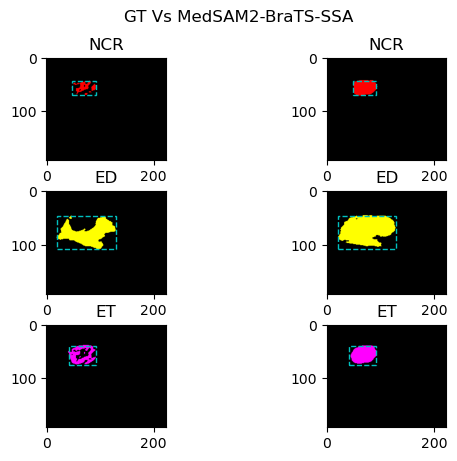

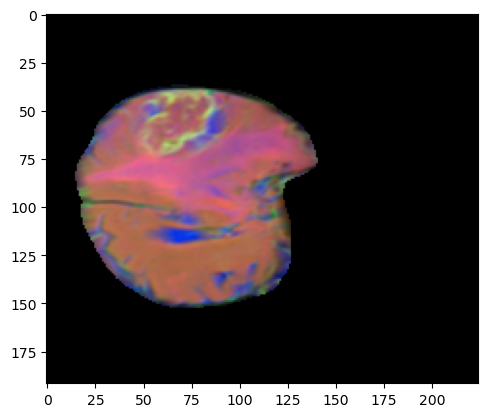

In [17]:
visualize(SSA_TTA_dataset, SSA_TTA_label_boxes, 'GT Vs MedSAM2-BraTS-SSA', SSA_video_path)

## Visualization -  Performance of TTA Finetuned MedSAM on BraTS-GLI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


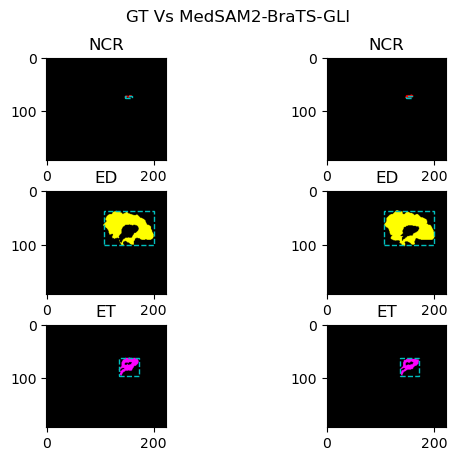

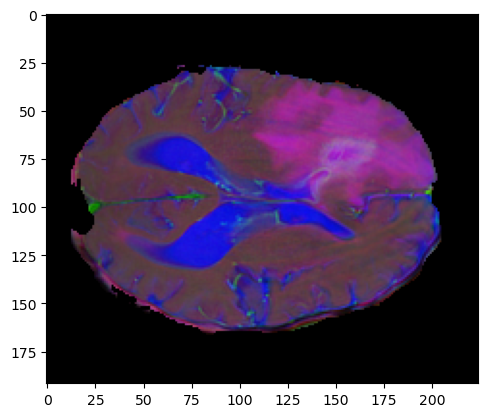

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


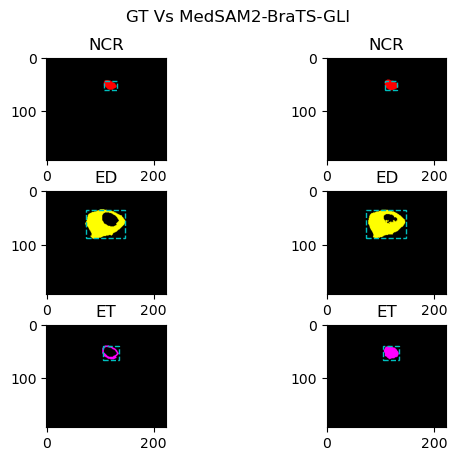

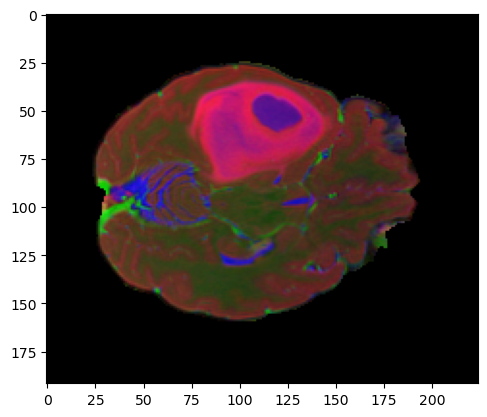

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


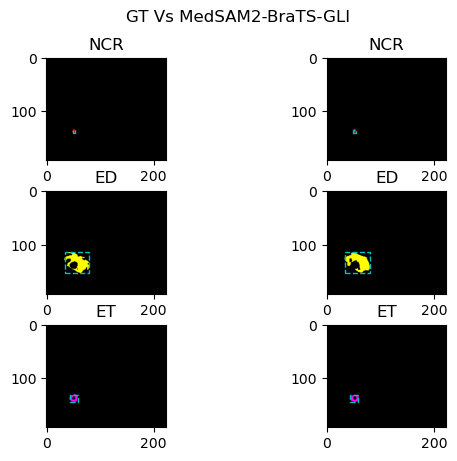

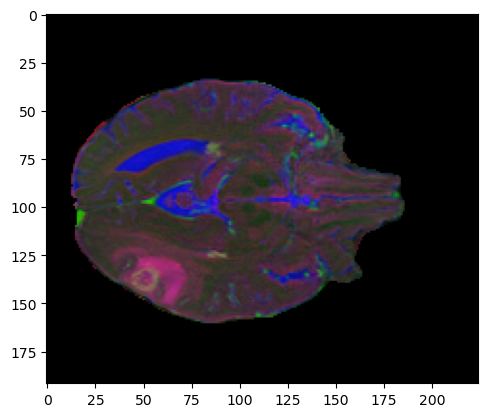

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


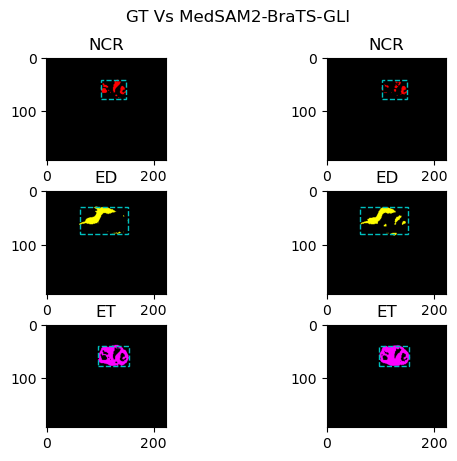

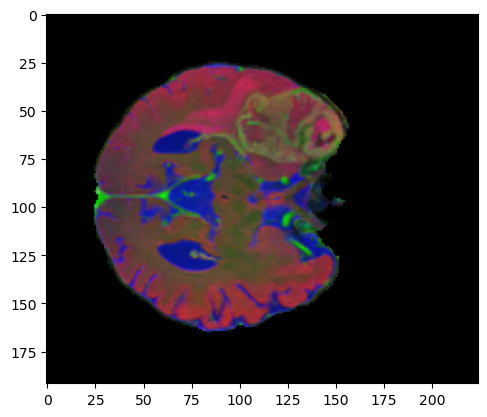

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


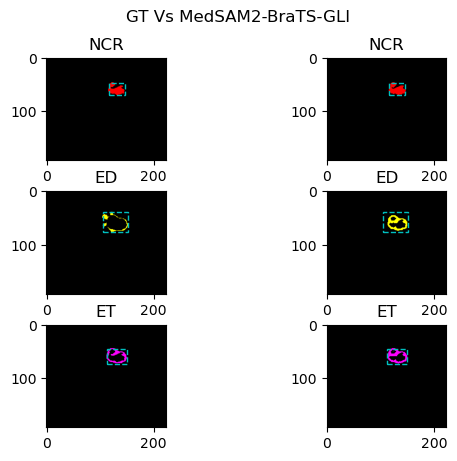

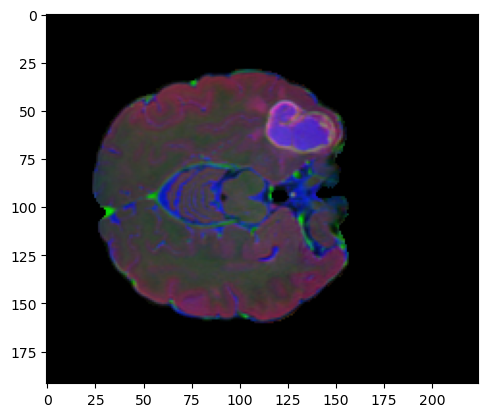

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


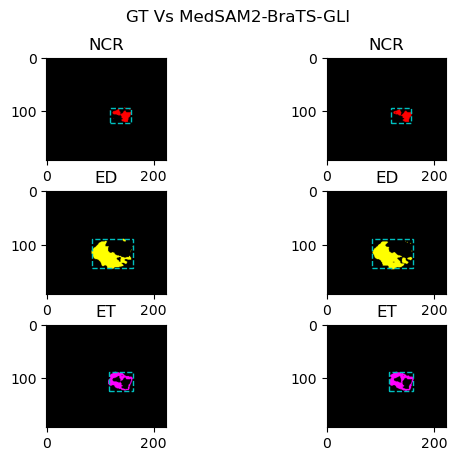

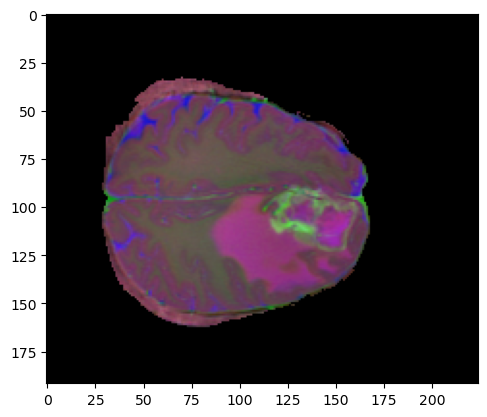

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


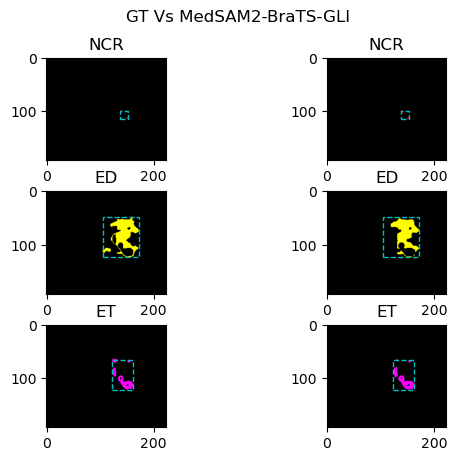

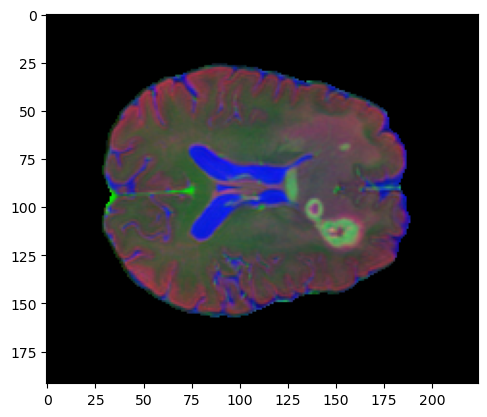

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


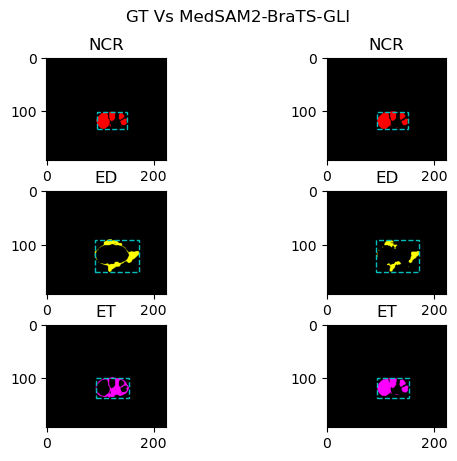

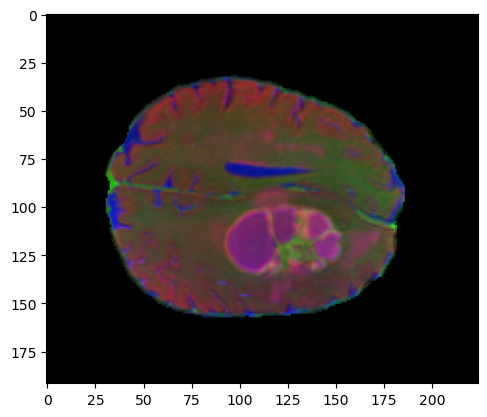

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


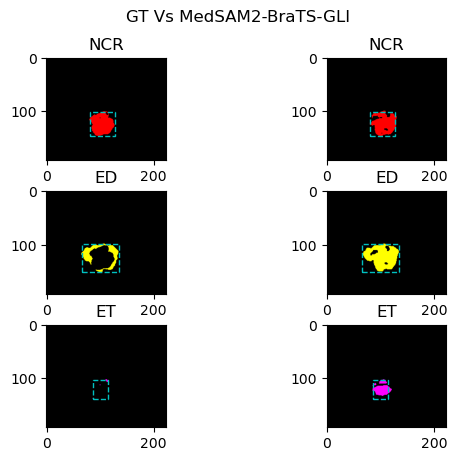

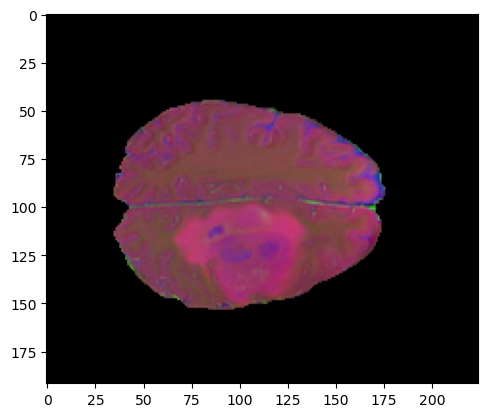

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


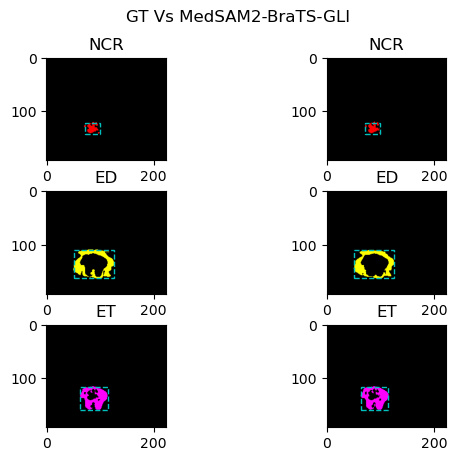

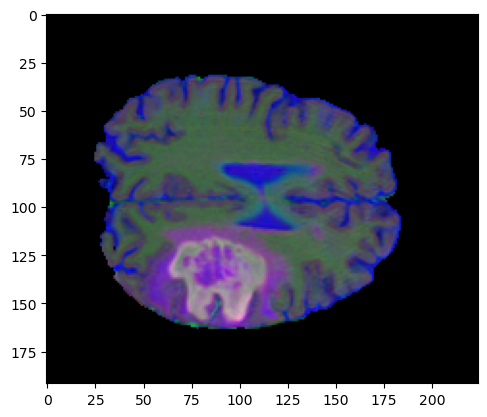

In [18]:
visualize(GLI_TTAFT_dataset, GLI_TTA_TF_label_boxes, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path)

## Visualization -  Performance of TTA Finetuned MedSAM on BraTS-SSA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


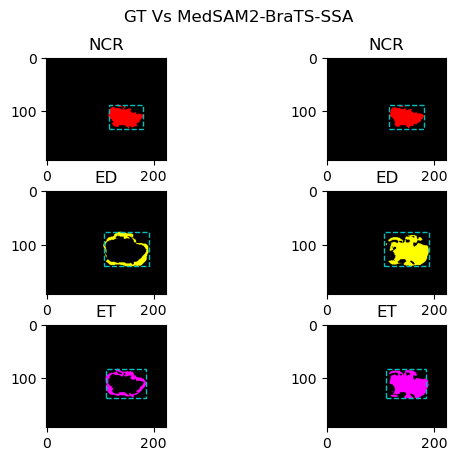

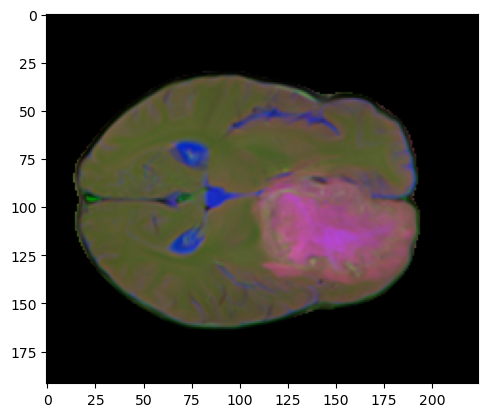

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


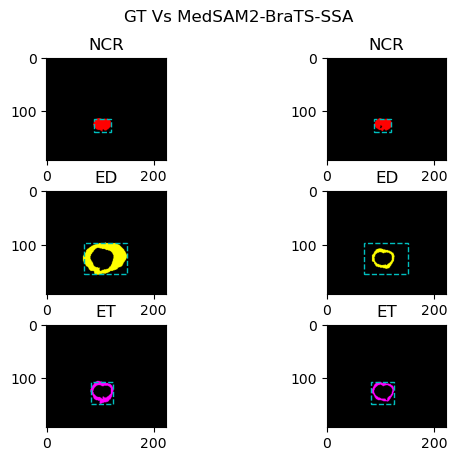

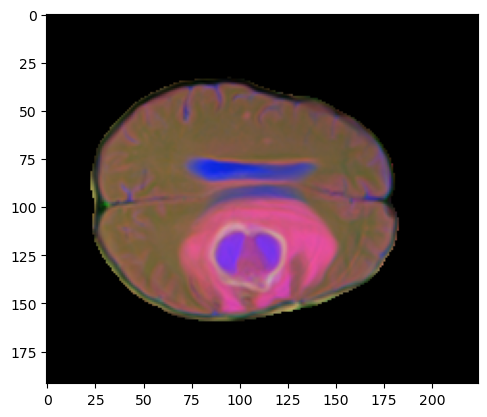

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


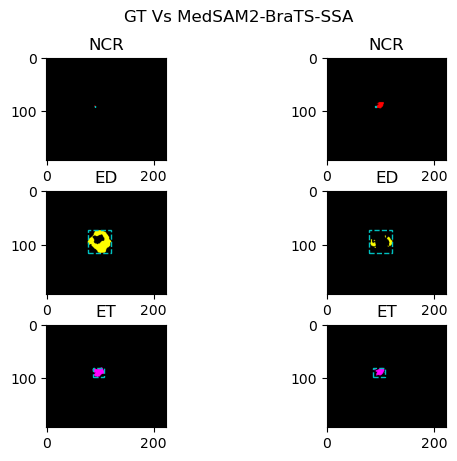

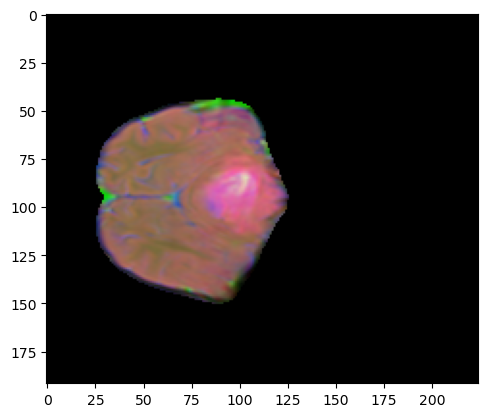

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


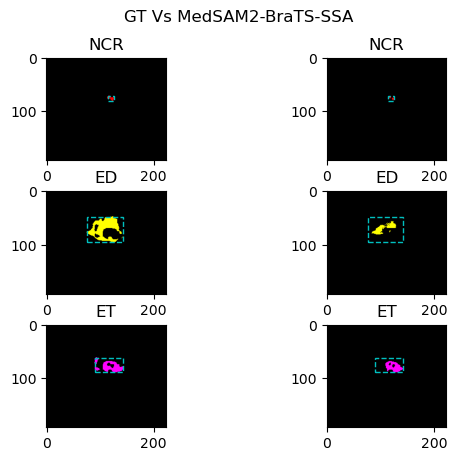

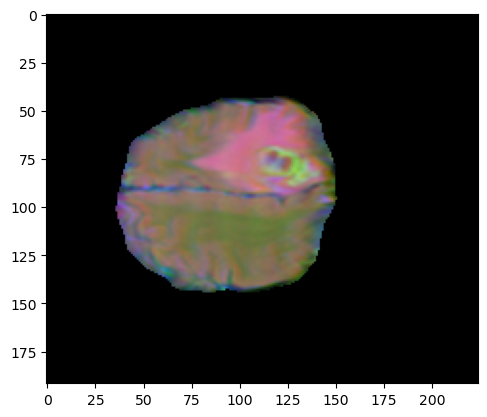

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


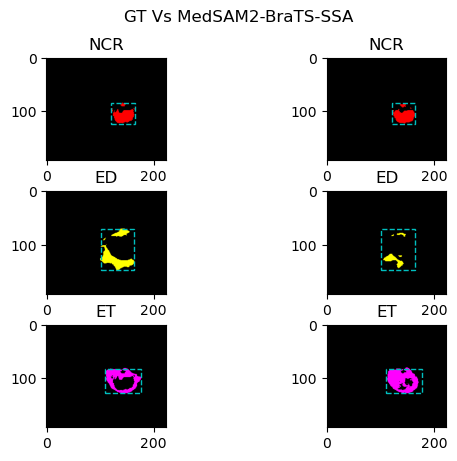

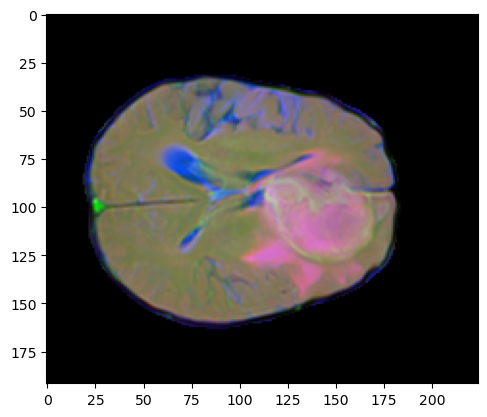

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


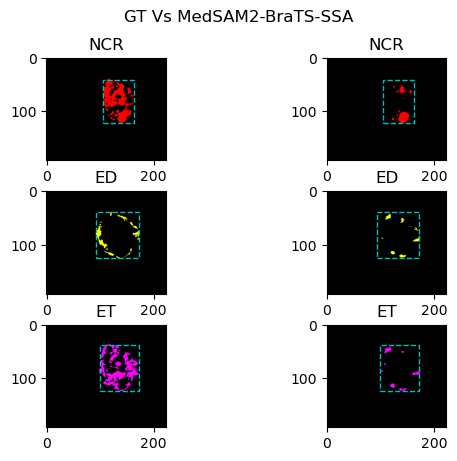

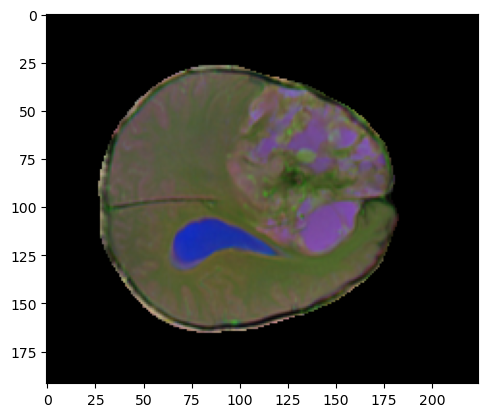

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


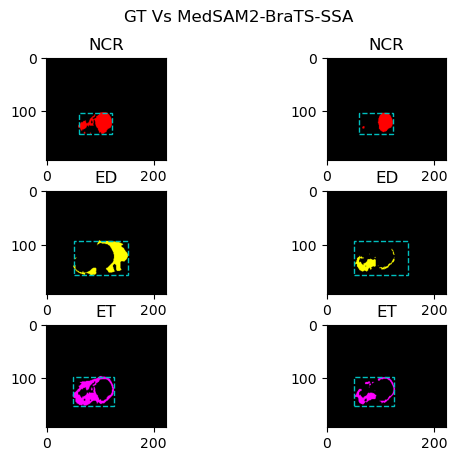

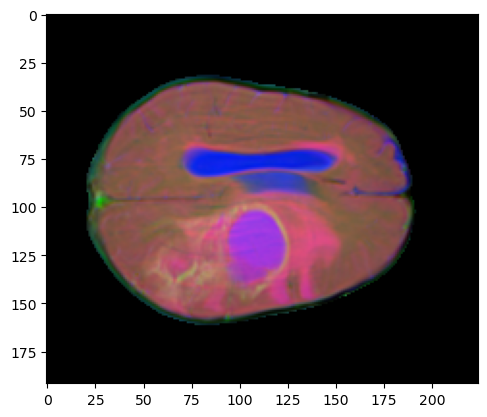

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


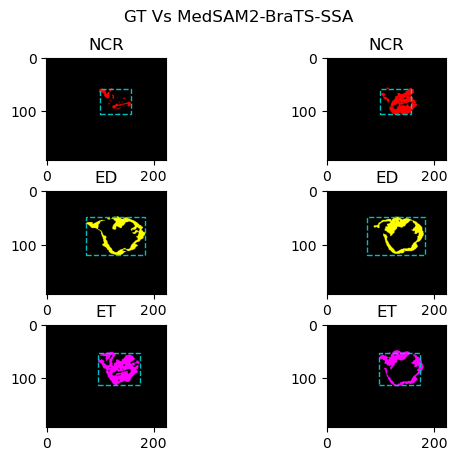

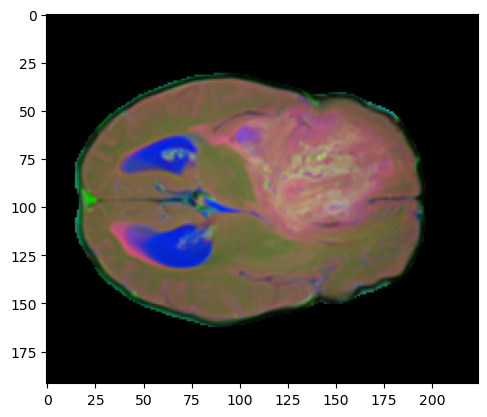

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


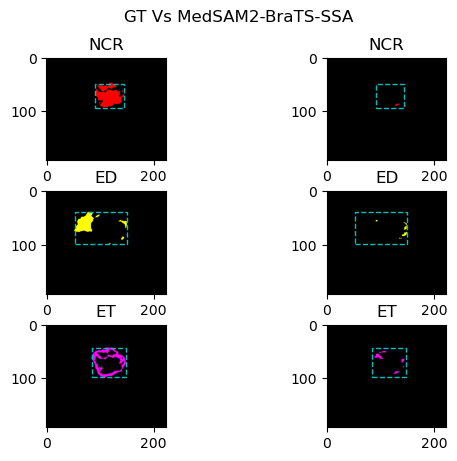

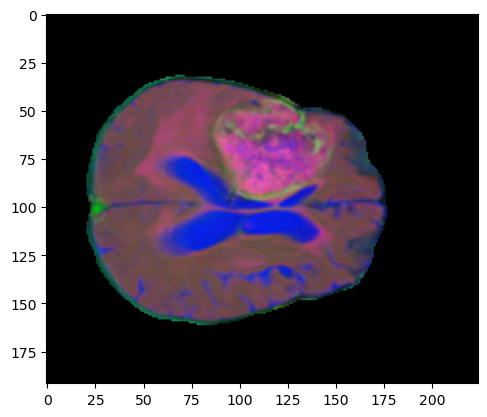

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


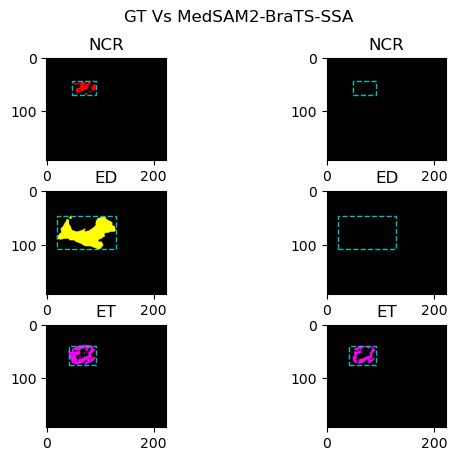

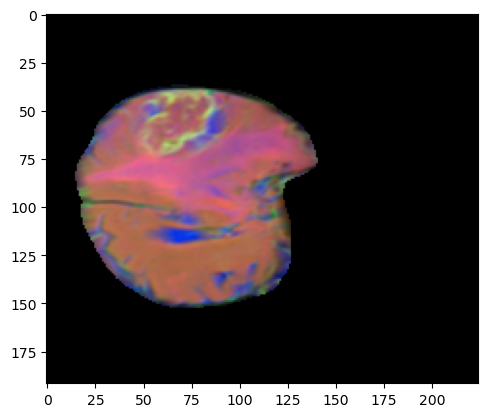

In [19]:
visualize(SSA_TTAFT_dataset, SSA_TTA_TF_label_boxes, 'GT Vs MedSAM2-BraTS-SSA', SSA_video_path)

## Brightness Perturbations - BRATS-GLI

In [15]:
GLI_video_path = '/scratch_net/ken/radjoe/BraTS/TTA/images_UNN'
GLI_label_path = '/scratch_net/ken/radjoe/BraTS/TTA/labels_UNN'

In [16]:
os.listdir(GLI_label_path)

['BraTS-GLI-00000-000-lbl.npy',
 'BraTS-GLI-00008-001-lbl.npy',
 'BraTS-GLI-00005-000-lbl.npy',
 'BraTS-GLI-00006-000-lbl.npy']

In [17]:
GLI_FT_dataset = MRIDataset(GLI_video_path, GLI_label_path)

['BraTS-GLI-00000-000-stk.npy', 'BraTS-GLI-00006-000-stk.npy', 'BraTS-GLI-00005-000-stk.npy', 'BraTS-GLI-00008-001-stk.npy']


In [17]:
import numpy as np
import albumentations as A

class TargetedEDETFromLabel(A.DualTransform):
    """
    Reduce contrast inside ED / ET regions, inferred from a multi-class label.

    Expects:
      - image: H x W x C (numpy, HWC)
      - label: H x W (multi-class ints)

    Args:
      ed_id, et_id: class IDs in `label` for edema and enhancing tumor.
      ed_modalities, et_modalities: channel indices to affect.
      ed_scale/et_scale: multiplicative scale range inside mask.
      ed_gamma/et_gamma: gamma range inside mask.
      alpha: soft blend factor (1.0 = hard replace).
    """

    def __init__(
        self,
        ed_id: 1,
        et_id: 2,
        ed_modalities=(1, 2),   # e.g., T2, FLAIR (adjust to your channel order)
        et_modalities=(3,),     # e.g., T1ce
        ed_scale=(0.7, 0.9),
        et_scale=(0.7, 0.9),
        ed_gamma=(0.9, 1.1),
        et_gamma=(0.9, 1.1),
        alpha: float = 1.0,
        always_apply=False,
        p: float = 0.5,
        eps: float = 1e-6,
    ):
        super().__init__(always_apply=always_apply, p=p)
        self.ed_id = int(ed_id)
        self.et_id = int(et_id)
        self.ed_modalities = tuple(ed_modalities)
        self.et_modalities = tuple(et_modalities)
        self.ed_scale = tuple(ed_scale)
        self.et_scale = tuple(et_scale)
        self.ed_gamma = tuple(ed_gamma)
        self.et_gamma = tuple(et_gamma)
        self.alpha = float(alpha)
        self.eps = float(eps)

    # tell Albumentations we need `label` to sample params
    @property
    def targets_as_params(self):
        return ["image", "label"]

    def get_transform_init_args_names(self):
        return ("ed_id","et_id","ed_modalities","et_modalities",
                "ed_scale","et_scale","ed_gamma","et_gamma","alpha","eps")

    def get_params_dependent_on_targets(self, params):
        # sample once per sample-call (Albumentations handles consistency across targets)
        ed_scale = float(np.random.uniform(*self.ed_scale))
        et_scale = float(np.random.uniform(*self.et_scale))
        ed_gamma = float(np.random.uniform(*self.ed_gamma))
        et_gamma = float(np.random.uniform(*self.et_gamma))
        return dict(ed_scale=ed_scale, et_scale=et_scale,
                    ed_gamma=ed_gamma, et_gamma=et_gamma)

    def apply(self, img, **params):
        # img: HWC
        label = params.get("label", None)
        if label is None:
            return img

        ed_scale = params["ed_scale"]; et_scale = params["et_scale"]
        ed_gamma = params["ed_gamma"]; et_gamma = params["et_gamma"]

        x = img.astype(np.float32, copy=True)
        H, W, C = x.shape

        # build masks from label (support HW or HWC with last dim=1)
        lab = np.asarray(label)
        if lab.ndim == 3 and lab.shape[-1] == 1: lab = lab[..., 0]
        ed_mask = (lab == self.ed_id)
        et_mask = (lab == self.et_id)

        def _apply_on_channel(ch, mask, scale, gamma):
            if mask is None or not mask.any(): return ch
            cmin = float(ch.min()); cmax = float(ch.max())
            if (cmax - cmin) <= self.eps: return ch
            xn = (ch - cmin) / (cmax - cmin + self.eps)
            x_aug = scale * np.clip(np.power(xn, gamma), 0.0, 1.0)
            x_aug = x_aug * (cmax - cmin) + cmin
            if self.alpha >= 1.0:
                return np.where(mask, x_aug, ch)
            else:
                blend = self.alpha * x_aug + (1 - self.alpha) * ch
                return np.where(mask, blend, ch)

        if ed_mask.any():
            for m in self.ed_modalities:
                if 0 <= m < C:
                    x[..., m] = _apply_on_channel(x[..., m], ed_mask, ed_scale, ed_gamma)
        if et_mask.any():
            for m in self.et_modalities:
                if 0 <= m < C:
                    x[..., m] = _apply_on_channel(x[..., m], et_mask, et_scale, et_gamma)

        # cast back to original dtype range (keep float32 if you feed floats)
        return x.astype(img.dtype, copy=False)

    # we don’t want to alter the label
    def apply_to_mask(self, mask, **params):
        return mask


In [22]:
# View Transforms for each sample
view_transform = A.Compose(
    [
        TargetedEDETFromLabel(
            # adjust indices to your channel order!
            ed_id=1, et_id=2,            # set to your label IDs
            ed_modalities=(1,2),          # e.g., T2, FLAIR channels
            et_modalities=(0,),           # e.g., T1ce channel
            ed_scale=(0.1, 0.4),
            et_scale=(0.1, 0.4),
            ed_gamma=(1.3, 1.7),
            et_gamma=(1.3, 1.7),
            alpha=1.0,
            p=0.5,
        ),
        ToTensorV2(),
        # ... other Albumentations augs ...
    ],
)

/tmp/ipykernel_339/2245637593.py:35: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    4,   26,   81,  159,  231,  287,  370,  484,  613,  785,  951,
        1118, 1300, 1551, 1759, 1876, 1965, 2098, 2141, 2125, 2135, 2161, 2158,
        2163, 2147, 2117, 2057, 2003, 2002, 2007, 2012, 1994, 1946, 1885, 1846,
        1850, 1822, 1770, 1711, 1649, 1574, 1509, 1439, 1386, 1319, 1258, 1154,
        1050,  938,  827,  715,  596,  493,  322,  238,  144,   91,   68,   43,
          21,    2,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
         

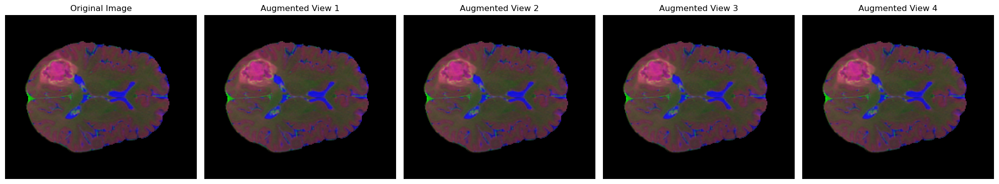

The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    7,   14,   28,   79,  167,  220,  338,  539,  551,  707,
         948, 1203, 1330, 1445, 1555, 1655, 1742, 1835, 1916, 1990, 2047, 2110,
        2149, 2175, 2244, 2200, 2170, 2147, 2039, 1996, 1957, 1908, 1834, 1791,
        1746, 1701, 1649, 1590, 1535, 1481, 1403, 1365, 1337, 1300, 1261, 1209,
        1170, 1109,  984,  878,  769,  648,  585,  558,  530,  496,  466,  420,
         

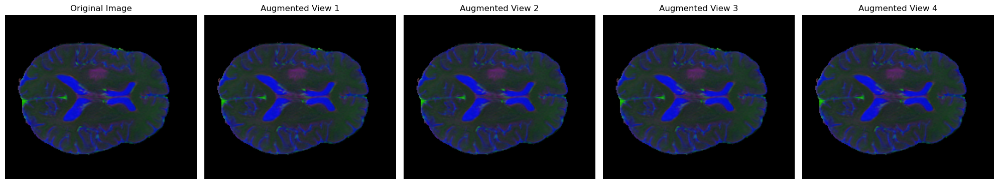

The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,   16,   73,  146,  237,  328,  421,  644,  966, 1111, 1198, 1252,
        1319, 1406, 1484, 1544, 1580, 1624, 1642, 1653, 1654, 1647, 1622, 1586,
        1541, 1453, 1309, 1194, 1084,  874,  727,  606,  490,  372,  292,  225,
         144,   66,   16,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
         

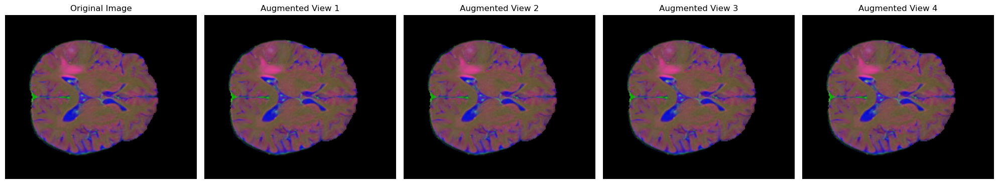

The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    6,   27,   49,   80,  113,  141,  159,  191,
         243,  281,  326,  384,  451,  535,  625,  822,  984, 1167, 1345, 1497,
        1678, 1780, 1858, 1962, 2144, 2216, 2288, 2315, 2373, 2408, 2433, 2497,
        2535, 2545, 2537, 2503, 2466, 2444, 2459, 2442, 2400, 2395, 2368, 2267,
        2234, 2202, 2155, 2098, 2007, 1941, 1861, 1783, 1730, 1678, 1615, 1538,
        1440, 1352, 1270, 1214, 1150, 1064,  994,  933,  875,  827,  783,  744,
         677,  603,  538,  476,  423,  365,  314,  245,  135,   51,    1,    0,
         

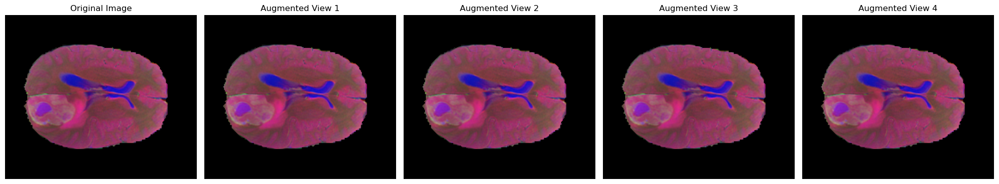

The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,   21,  147,  349,  543,  641,  764,  878, 1051, 1143,
        1330, 1487, 1655, 1806, 1999, 2180, 2309, 2425, 2497, 2587, 2692, 2760,
        2806, 2815, 2825, 2829, 2825, 2851, 2877, 2889, 2909, 2829, 2778, 2723,
        2599, 2530, 2481, 2395, 2354, 2294, 2221, 2176, 2108, 2078, 2031, 1931,
        1827, 1717, 1604, 1482, 1393, 1308, 1230, 1156, 1038,  960,  903,  840,
         

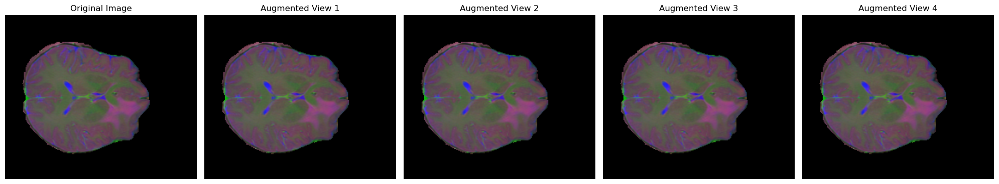

The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,   18,   35,
          70,  120,  185,  241,  331,  422,  548,  715,  943, 1282, 1768, 2144,
        2326, 2437, 2532, 2574, 2635, 2637, 2637, 2627, 2623, 2618, 2642, 2640,
        2686, 2707, 2699, 2619, 2609, 2622, 2636, 2675, 2695, 2690, 2665, 2627,
        2585, 2565, 2541, 2504, 2472, 2478, 2477, 2470, 2472, 2457, 2416, 2361,
        2271, 2174, 2050, 1922, 1836, 1756, 1697, 1631, 1568, 1497, 1414, 1297,
        1

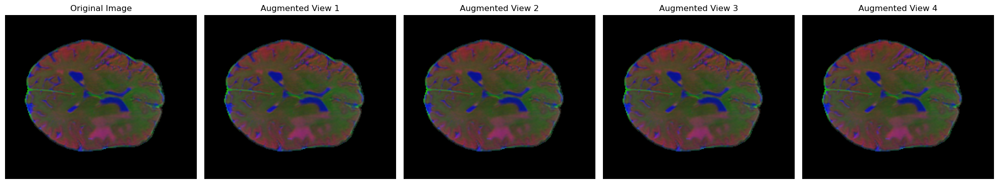

The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    3,
          20,   33,   43,   56,  104,  154,  227,  354,  491,  721,  922, 1104,
        1292, 1449, 1573, 1671, 1745, 1790, 1831, 1851, 1869, 1873, 1881, 1907,
        1952, 1989, 2057, 2173, 2295, 2403, 2469, 2515, 2553, 2571, 2530, 2475,
        2433, 2372, 2359, 2326, 2289, 2259, 2208, 2180, 2126, 2071, 1978, 1895,
        1820, 1716, 1621, 1564, 1525, 1482, 1411, 1312, 1206, 1079,  985,  866,
         

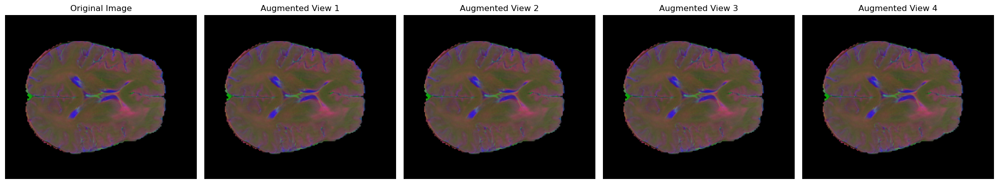

The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    1,   80,  304,  647,  791,  887,  982, 1139,
        1362, 1627, 1847, 1998, 2148, 2299, 2482, 2672, 2782, 2880, 2960, 3041,
        3132, 3229, 3293, 3342, 3380, 3415, 3440, 3452, 3466, 3495, 3503, 3495,
        3485, 3461, 3419, 3371, 3319, 3247, 3169, 3099, 3018, 2940, 2841, 2733,
        2627, 2517, 2403, 2274, 2165, 2048, 1943, 1801, 1702, 1565, 1369, 1212,
        1067,  925,  763,  550,  260,   91,    7,    0,    0,    0,    0,    0,
         

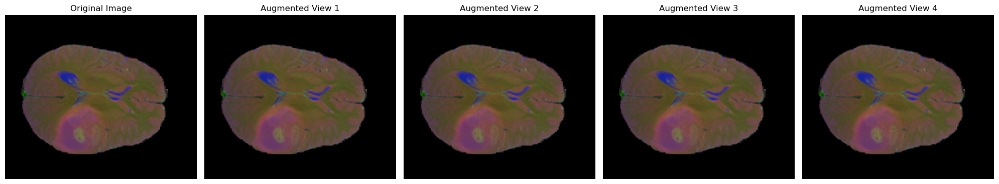

The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    2,   24,   82,  131,  190,  233,  281,  313,  366,
         386,  425,  451,  473,  533,  589,  628,  644,  713,  835,  944,  983,
        1055, 1154, 1195, 1320, 1405, 1486, 1562, 1615, 1592, 1614, 1664, 1666,
        1669, 1684, 1689, 1676, 1650, 1575, 1415, 1276, 1092,  895,  730,  587,
         492,  402,  346,  296,  272,  248,  221,  178,  112,   43,   16,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
         

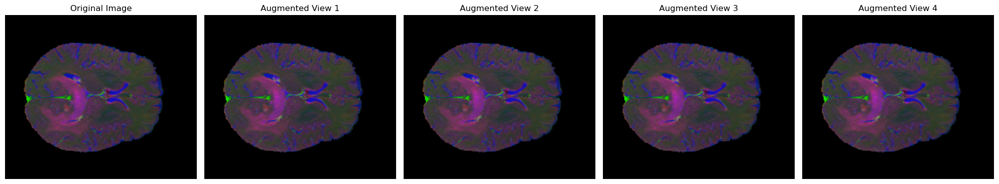

The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    1,   50,  145,  214,  269,  376,
         565,  831, 1210, 1478, 1652, 1816, 1956, 2091, 2210, 2303, 2419, 2542,
        2610, 2668, 2721, 2771, 2826, 2868, 2907, 2939, 2989, 3024, 3068, 3094,
        3072, 3050, 3031, 2956, 2924, 2854, 2782, 2723, 2680, 2635, 2560, 2478,
        2383, 2292, 2150, 2034, 1978, 1907, 1797, 1680, 1582, 1530, 1447, 1366,
        1196, 1102,  987,  813,  684,  508,  388,  240,   95,    0,    0,    0,
         

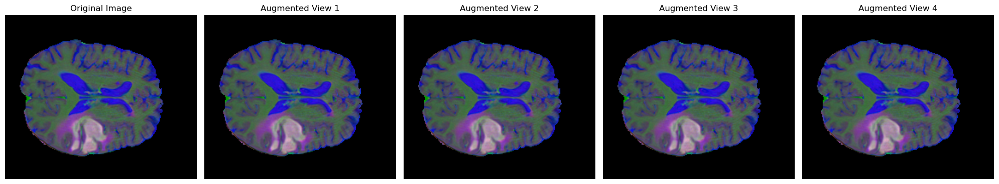

In [23]:
visualize_views(GLI_FT_dataset, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, view_transform=view_transform)

## Brightness Perturbations - BRATS-SSA

In [14]:
SSA_video_path = '/scratch_net/ken/radjoe/BraTS/TTA_Africa/images_UNN'
SSA_label_path = '/scratch_net/ken/radjoe/BraTS/TTA_Africa/labels_UNN'

In [15]:
SSA_FT_dataset = MRIDataset(SSA_video_path, SSA_label_path)

['BraTS-SSA-00010-000-stk.npy', 'BraTS-SSA-00008-000-stk.npy', 'BraTS-SSA-00007-000-stk.npy', 'BraTS-SSA-00002-000-stk.npy']


The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,   26,
          55,   88,  121,  183,  308,  484,  746,  904, 1006, 1096, 1174, 1251,
        1316, 1369, 1411, 1455, 1504, 1537, 1556, 1559, 1556, 1535, 1523, 1503,
        1481, 1458, 1421, 1387, 1363, 1336, 1289, 1233, 1153, 1050,  945,  756,
         551,  269,   57,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,   21,   47,   75,  113,  102,  153,  182,  240,  290,  337,
         398,  443,  751,  751, 1009,  932, 1038, 1382, 1562, 2018, 2376, 2636,
        2928, 3215, 3404, 3506, 3572, 3627, 3661, 3696, 3721, 3740, 3758, 3771,
        3758, 3730, 3700, 3696, 3675, 3687, 3683, 3647, 3636, 3611, 3572, 3518,
        3499, 3489, 3481, 3482, 3508, 3485, 3426, 3402, 3359, 3316, 3276, 3208,
        3127, 3029, 2939, 2855, 2721, 2494, 2281, 2052, 1805, 1646, 1522, 1425,
        1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..-1.7875938].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..-1.7875507].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..-1.7875507].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..-1.7875507].


Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)
Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)
Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)
Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)


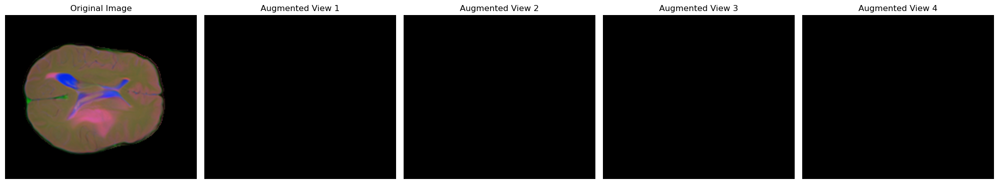

The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    2,    0,  204,  590,  686,  728,  867, 1010, 1051, 1085, 1287,
        1501, 1777, 2256, 2655, 3048, 3493, 3735, 3949, 4135, 4298, 4469, 4614,
        4733, 4900, 5113, 5247, 5315, 5422, 5671, 5670, 5758, 5759, 5729, 5735,
        5787, 5878, 5936, 6009, 6056, 6127, 6123, 6095, 6172, 6014, 5996, 5964,
        5896, 5810, 5684, 5566, 5470, 5453, 5173, 5127, 4880, 4760, 4482, 4196,
        3963, 3851, 3716, 3632, 3526, 3209, 2972, 2930, 2830, 2468, 2305, 1986,
        1760, 1422, 1306, 1204, 1110,  993,  700,  535,  482,  440,  381,  288,
         

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1177888..-1.7895222].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..-1.7896005].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117813..-1.7895837].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..-1.7896005].


Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)
Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)
Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)
Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)


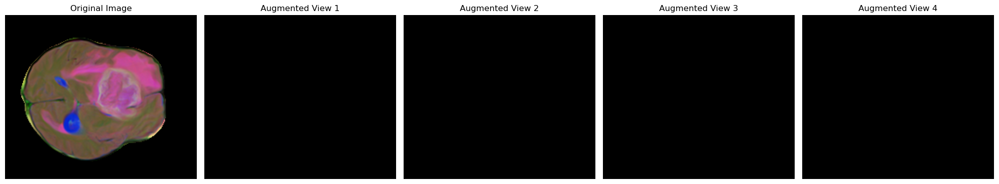

The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,   40,   46,  172,
         286,  518,  652,  783,  931, 1113, 1292, 1335, 1457, 1552, 1596, 1661,
        1704, 1758, 1818, 1855, 1896, 1908, 1942, 1978, 2010, 2083, 2119, 2130,
        2187, 2219, 2273, 2303, 2332, 2356, 2370, 2370, 2357, 2352, 2337, 2314,
        2295, 2263, 2196, 2107, 1970, 1839, 1693, 1598, 1479, 1368, 1275, 1176,
        1035,  957,  894,  816,  715,  591,  510,  446,  389,  347,  300,  237,
         188,  124,   65,   14,    0,    0,    0,    0,    0,    0,    0,    0,
         

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..-1.7885691].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..-1.788481].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..-1.7886078].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117785..-1.7885041].


Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)
Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)
Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)
Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)


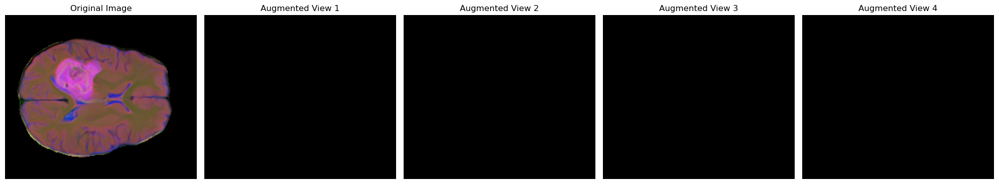

The original shape of label: torch.Size([3, 192, 224, 160])
The shape of label: tensor([0., 1.])
label counts: tensor([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,   55,
         113,  144,  210,  272,  400,  538,  838, 1019, 1420, 1585, 1842, 1979,
        2062, 2571, 2783, 2919, 3014, 3184, 3311, 3406, 3493, 3560, 3662, 3736,
        3789, 3860, 3929, 3956, 3979, 4018, 3928, 3905, 3880, 3839, 3819, 3783,
        3837, 3857, 3799, 3708, 3650, 3591, 3583, 3471, 3324, 3222, 3073, 2985,
        2896, 2772, 2597, 2341, 2164, 1995, 1837, 1674, 1513, 1363, 1249, 1130,
         992,  982,  550,  394,  176,   67,   20,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
         

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..-1.7900733].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1178179..-1.7899581].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..-1.7901982].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..-1.7902051].


Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)
Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)
Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)
Image shape: (192, 224, 3)
Mask shape: (192, 224, 4)


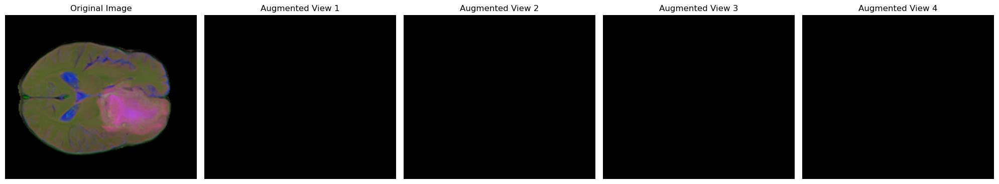

In [16]:
visualize_views(SSA_FT_dataset, 'GT Vs MedSAM2-BraTS-GLI', SSA_video_path, view_transform=view_transform)